In [1]:
import os
import torch
from torch.utils.data import Dataset
from PIL import Image
import torchvision.transforms as transforms


In [2]:
import shutil
shutil.copytree('/kaggle/input/od-data/OD Data','/kaggle/working/OD Data',dirs_exist_ok=True)

'/kaggle/working/OD Data'

In [3]:
class SignatureDataset(Dataset):
    def __init__(self, image_dir, label_dir, transform=None, target_size=(512, 512)):
        self.image_dir = image_dir
        self.label_dir = label_dir
        self.image_filenames = [f for f in os.listdir(image_dir) if f.endswith(".tif")]
        self.transform = transform
        self.target_size = target_size  # (width, height)

    def __len__(self):
        return len(self.image_filenames)

    def __getitem__(self, idx):
        img_name = self.image_filenames[idx]
        img_path = os.path.join(self.image_dir, img_name)
        image = Image.open(img_path).convert("RGB")
        original_size = image.size  # (width, height)

        # Resize image
        image = image.resize(self.target_size)

        # Load bounding boxes
        label_path = os.path.join(self.label_dir, img_name.replace(".tif", ".txt"))
        boxes = []
        with open(label_path, "r") as f:
            for line in f:
                x1, y1, x2, y2 = map(float, line.strip().split(','))
                
                # Scale box to new size
                x_scale = self.target_size[0] / original_size[0]
                y_scale = self.target_size[1] / original_size[1]
                x1 *= x_scale
                x2 *= x_scale
                y1 *= y_scale
                y2 *= y_scale
                
                boxes.append([x1, y1, x2, y2])
        boxes = torch.tensor(boxes, dtype=torch.float32)

        if self.transform:
            image = self.transform(image)

        return image, boxes


In [4]:
transform = transforms.Compose([
    transforms.Resize((512, 512)),
    transforms.ToTensor()
])

train_dataset = SignatureDataset("/kaggle/working/OD Data/TrainImages", "/kaggle/working/OD Data/TrainGroundTruth", transform=transform)
image, boxes = train_dataset[0]

print("Image shape:", image.shape)
print("Boxes:", boxes)


Image shape: torch.Size([3, 512, 512])
Boxes: tensor([[296.4480, 294.9120, 431.6160, 313.8560]])


In [5]:
import matplotlib.pyplot as plt
import torchvision.transforms.functional as TF

def show_image_with_boxes(image, boxes):
    # Convert tensor image to PIL if needed
    if isinstance(image, torch.Tensor):
        image = TF.to_pil_image(image)

    plt.figure(figsize=(8, 8))
    plt.imshow(image)
    
    for box in boxes:
        x1, y1, x2, y2 = box
        x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)
        print(x1, y1, x2, y2)
        width, height = x2 - x1, y2 - y1
        rect = plt.Rectangle((x1, y1), width, height, edgecolor='red', facecolor='none', linewidth=2)
        plt.gca().add_patch(rect)
    
    plt.axis('off')
    plt.show()


296 294 431 313


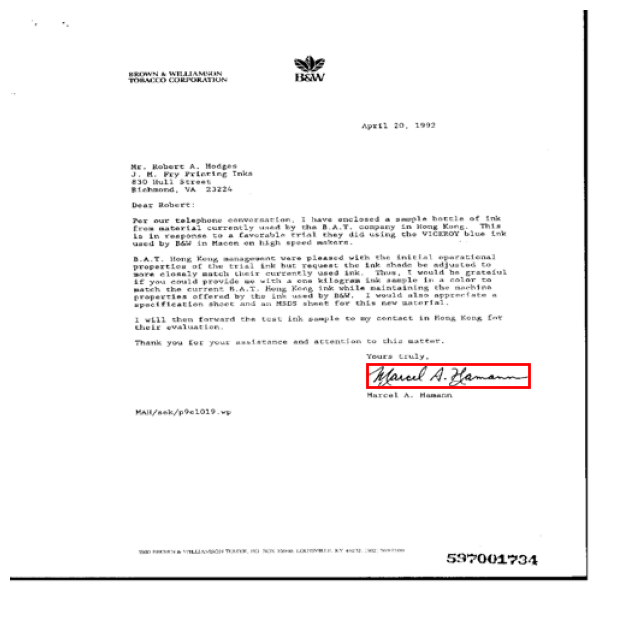

In [6]:
image, boxes = train_dataset[0]
show_image_with_boxes(image, boxes)


In [7]:
from torchvision.models import vgg16, VGG16_Weights
from torchvision import models
import torch.nn as nn

def vgg16_backbone():
    vgg = vgg16(weights=VGG16_Weights.IMAGENET1K_V1)
    features = list(vgg.features.children())
    for layer in features:
        for param in layer.parameters():
            param.requires_grad = False
    return nn.Sequential(*features)


In [8]:
import torch
import itertools

def generate_anchors(feature_height, feature_width, stride, sizes, ratios):
    anchors = []
    for y in range(feature_height):
        for x in range(feature_width):
            cx = x * stride + stride // 2
            cy = y * stride + stride // 2

            for size, ratio in itertools.product(sizes, ratios):
                area = size * size
                w = (area / ratio) ** 0.5
                h = area / w
                anchors.append([
                    cx - w / 2, cy - h / 2,
                    cx + w / 2, cy + h / 2
                ])
    return torch.tensor(anchors, dtype=torch.float32)


In [9]:
class RPNHead(nn.Module):
    def __init__(self, in_channels, num_anchors):
        super(RPNHead, self).__init__()
        self.conv = nn.Conv2d(in_channels, 512, kernel_size=3, padding=1)
        self.objectness_logits = nn.Conv2d(512, num_anchors, kernel_size=1)
        self.bbox_deltas = nn.Conv2d(512, num_anchors * 4, kernel_size=1)

    def forward(self, x):
        t = F.relu(self.conv(x))
        logits = self.objectness_logits(t)
        bbox_regs = self.bbox_deltas(t)
        return logits, bbox_regs


In [10]:
def compute_iou(boxes1, boxes2):
    """Computes IoU between each box in boxes1 and all boxes in boxes2"""
    area1 = (boxes1[:, 2] - boxes1[:, 0]) * (boxes1[:, 3] - boxes1[:, 1])
    area2 = (boxes2[:, 2] - boxes2[:, 0]) * (boxes2[:, 3] - boxes2[:, 1])

    lt = torch.max(boxes1[:, None, :2], boxes2[:, :2])  # (A, G, 2)
    rb = torch.min(boxes1[:, None, 2:], boxes2[:, 2:])  # (A, G, 2)

    wh = (rb - lt).clamp(min=0)
    inter = wh[:, :, 0] * wh[:, :, 1]

    union = area1[:, None] + area2 - inter
    iou = inter / union
    return iou


In [11]:
def encode_boxes(anchors, gt_boxes):
    """Compute deltas between anchors and ground truth boxes"""
    anchors_wh = anchors[:, 2:] - anchors[:, :2]
    anchors_ctr = anchors[:, :2] + 0.5 * anchors_wh

    gt_wh = gt_boxes[:, 2:] - gt_boxes[:, :2]
    gt_ctr = gt_boxes[:, :2] + 0.5 * gt_wh

    dx = (gt_ctr[:, 0] - anchors_ctr[:, 0]) / anchors_wh[:, 0]
    dy = (gt_ctr[:, 1] - anchors_ctr[:, 1]) / anchors_wh[:, 1]
    dw = torch.log(gt_wh[:, 0] / anchors_wh[:, 0])
    dh = torch.log(gt_wh[:, 1] / anchors_wh[:, 1])

    deltas = torch.stack([dx, dy, dw, dh], dim=1)
    return deltas


In [12]:
import torch.nn.functional as F

def rpn_loss(anchors, objectness_preds, bbox_deltas_preds, gt_boxes, iou_threshold=0.7):
    """
    anchors: [N, 4]
    objectness_preds: [N]
    bbox_deltas_preds: [N, 4]
    gt_boxes: [M, 4]
    """
    iou = compute_iou(anchors, gt_boxes)  # [N, M]
    max_iou, matched_idx = iou.max(dim=1)  # Best gt for each anchor

    # Create labels: 1 = positive, 0 = negative, -1 = ignore
    labels = torch.full((anchors.shape[0],), -1, dtype=torch.int64, device=anchors.device)
    labels[max_iou < 0.3] = 0
    labels[max_iou >= iou_threshold] = 1

    # Classification loss
    valid = labels >= 0
    cls_loss = F.binary_cross_entropy_with_logits(objectness_preds[valid], labels[valid].float())

    # Regression loss only for positive anchors
    pos_idx = labels == 1
    if pos_idx.sum() > 0:
        matched_gt = gt_boxes[matched_idx[pos_idx]]
        deltas = encode_boxes(anchors[pos_idx], matched_gt)
        reg_loss = F.smooth_l1_loss(bbox_deltas_preds[pos_idx], deltas)
    else:
        reg_loss = torch.tensor(0.0, device=anchors.device)

    return cls_loss, reg_loss


In [13]:
def apply_deltas_to_anchors(anchors, deltas):
    """
    Apply predicted deltas to anchors to get refined boxes
    anchors: [N, 4]
    deltas: [N, 4]
    returns: [N, 4] (x1, y1, x2, y2)
    """
    widths = anchors[:, 2] - anchors[:, 0]
    heights = anchors[:, 3] - anchors[:, 1]
    ctr_x = anchors[:, 0] + 0.5 * widths
    ctr_y = anchors[:, 1] + 0.5 * heights

    dx = deltas[:, 0]
    dy = deltas[:, 1]
    dw = deltas[:, 2]
    dh = deltas[:, 3]

    pred_ctr_x = dx * widths + ctr_x
    pred_ctr_y = dy * heights + ctr_y
    pred_w = torch.exp(dw) * widths
    pred_h = torch.exp(dh) * heights

    pred_boxes = torch.zeros_like(deltas)
    pred_boxes[:, 0] = pred_ctr_x - 0.5 * pred_w
    pred_boxes[:, 1] = pred_ctr_y - 0.5 * pred_h
    pred_boxes[:, 2] = pred_ctr_x + 0.5 * pred_w
    pred_boxes[:, 3] = pred_ctr_y + 0.5 * pred_h

    return pred_boxes


In [14]:
def clip_boxes(boxes, image_size):
    """
    boxes: [N, 4]
    image_size: (H, W)
    """
    x1 = boxes[:, 0].clamp(min=0, max=image_size[1] - 1)
    y1 = boxes[:, 1].clamp(min=0, max=image_size[0] - 1)
    x2 = boxes[:, 2].clamp(min=0, max=image_size[1] - 1)
    y2 = boxes[:, 3].clamp(min=0, max=image_size[0] - 1)
    return torch.stack([x1, y1, x2, y2], dim=1)


In [15]:
def remove_small_boxes(boxes, min_size):
    ws = boxes[:, 2] - boxes[:, 0]
    hs = boxes[:, 3] - boxes[:, 1]
    keep = (ws >= min_size) & (hs >= min_size)
    return keep.nonzero().squeeze(1)


In [16]:
import torchvision.ops as ops

def filter_proposals(anchors, objectness, deltas, image_size, pre_nms_topk=6000, post_nms_topk=300, nms_thresh=0.7, min_size=16):
    """
    anchors: [N, 4]
    objectness: [N]
    deltas: [N, 4]
    """
    # Apply deltas
    proposals = apply_deltas_to_anchors(anchors, deltas)
    proposals = clip_boxes(proposals, image_size)

    # Remove small boxes
    keep = remove_small_boxes(proposals, min_size)
    proposals = proposals[keep]
    scores = objectness[keep]

    # Take top-k before NMS
    num_proposals = min(pre_nms_topk, proposals.shape[0])
    scores, idx = scores.sort(descending=True)
    scores = scores[:num_proposals]
    proposals = proposals[idx[:num_proposals]]

    # Apply NMS
    keep_idx = ops.nms(proposals, scores, nms_thresh)
    keep_idx = keep_idx[:post_nms_topk]

    return proposals[keep_idx], scores[keep_idx]


In [17]:
class RegressorHead(nn.Module):
    def __init__(self, in_features=512 * 7 * 7, out_features=4):
        super().__init__()
        self.fc = nn.Sequential(
            nn.Linear(in_features, 1024),
            nn.ReLU(),
            nn.Linear(1024, 512),
            nn.ReLU(),
            nn.Linear(512, out_features)
        )

    def forward(self, x):
        return self.fc(x)


In [18]:
import torch.nn as nn
import torch.nn.functional as F
from torchvision.ops import roi_align

class FasterRCNN(nn.Module):
    def __init__(self, backbone, rpn_head, regressor_head, anchor_sizes, anchor_ratios, image_size=(512, 512)):
        super(FasterRCNN, self).__init__()
        self.backbone = backbone
        self.rpn_head = rpn_head
        self.regressor_head = regressor_head

        self.anchor_sizes = anchor_sizes
        self.anchor_ratios = anchor_ratios
        self.stride = 32  # VGG downsampling factor
        self.image_size = image_size

    def forward(self, images, targets=None):
        features = self.backbone(images)  # (B, C=512, H=16, W=16)
        B, C, H, W = features.shape

        # RPN
        objectness, bbox_deltas = self.rpn_head(features)

        objectness = objectness.permute(0, 2, 3, 1).reshape(B, -1)  # (B, num_anchors)
        bbox_deltas = bbox_deltas.permute(0, 2, 3, 1).reshape(B, -1, 4)  # (B, num_anchors, 4)

        all_proposals = []
        all_scores = []

        for b in range(B):
            anchors = generate_anchors(H, W, self.stride, self.anchor_sizes, self.anchor_ratios).to(images.device)
            proposals, scores = filter_proposals(
                anchors=anchors,
                objectness=torch.sigmoid(objectness[b]),
                deltas=bbox_deltas[b],
                image_size=self.image_size
            )
            all_proposals.append(proposals)
            all_scores.append(scores)

        # RoI Align
        pooled_features = []
        for b in range(B):
            proposals = all_proposals[b]
            feat = features[b].unsqueeze(0)  # (1, C, H, W)
            # Add batch indices to proposals
            boxes = proposals
            idxs = torch.full((boxes.shape[0], 1), 0, dtype=torch.float32, device=boxes.device)
            rois = torch.cat([idxs, boxes], dim=1)  # (N, 5): [batch_idx, x1, y1, x2, y2]
            pooled = roi_align(feat, rois, output_size=(7, 7), spatial_scale=1/32)
            pooled_features.append(pooled)

        pooled_features = torch.cat(pooled_features, dim=0)  # (total_proposals, C, 7, 7)
        pooled_features = pooled_features.view(pooled_features.size(0), -1)  # flatten

        # Final Regressor
        bbox_preds = self.regressor_head(pooled_features)

        return bbox_preds, all_proposals, all_scores


In [19]:
backbone = vgg16_backbone()
rpn = RPNHead(in_channels=512, num_anchors=9)
regressor = RegressorHead()

model = FasterRCNN(
    backbone=backbone,
    rpn_head=rpn,
    regressor_head=regressor,
    anchor_sizes=[64, 128, 256],
    anchor_ratios=[0.5, 1.0, 2.0],
    image_size=(512, 512)
)


Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:02<00:00, 214MB/s] 


In [20]:
def match_proposals_to_gt(proposals, gt_boxes):
    """
    For each proposal, match it to the highest-IoU GT box.
    """
    ious = compute_iou(proposals, gt_boxes)
    max_iou_idx = torch.argmax(ious, dim=1)
    return gt_boxes[max_iou_idx]


In [21]:
import torch
import torch.optim as optim
from tqdm import tqdm

def train_model(model, dataloader, num_epochs=10, lr=0.00002, device='cuda'):
    model.to(device)
    model.train()
    torch.autograd.set_detect_anomaly(True)
    optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=lr)

    for epoch in range(num_epochs):
        total_rpn_cls_loss = 0
        total_rpn_reg_loss = 0
        total_roi_loss = 0

        for images, gt_boxes in tqdm(dataloader):
            images = images.to(device)
            gt_boxes = [b.to(device) for b in gt_boxes]

            optimizer.zero_grad()
            
            # Forward pass
            bbox_preds, all_proposals, all_scores = model(images)

            # === RPN LOSS ===
            B, _, H, W = model.backbone(images).shape
            anchors = generate_anchors(H, W, model.stride, model.anchor_sizes, model.anchor_ratios).to(device)
            rpn_objectness, rpn_deltas = model.rpn_head(model.backbone(images))
            rpn_objectness = rpn_objectness.permute(0, 2, 3, 1).reshape(B, -1)
            rpn_deltas = rpn_deltas.permute(0, 2, 3, 1).reshape(B, -1, 4)

            cls_loss, reg_loss = rpn_loss(
                anchors,
                rpn_objectness[0],
                rpn_deltas[0],
                gt_boxes[0]
            )

            # === RoI LOSS ===
            pos_proposals = all_proposals[0]  # assumed to be aligned with regressor output
            if len(pos_proposals) > 0:
                matched_gt = match_proposals_to_gt(pos_proposals, gt_boxes[0])
                roi_loss = F.smooth_l1_loss(bbox_preds, encode_boxes(pos_proposals, matched_gt))
            else:
                roi_loss = torch.tensor(0.0, device=device)

            total_loss = cls_loss + reg_loss + roi_loss
            total_loss.backward()
            optimizer.step()

            total_rpn_cls_loss += cls_loss.item()
            total_rpn_reg_loss += reg_loss.item()
            total_roi_loss += roi_loss.item()

        print(f"Epoch [{epoch+1}/{num_epochs}]")
        print(f"  RPN cls loss: {total_rpn_cls_loss:.4f}")
        print(f"  RPN reg loss: {total_rpn_reg_loss:.4f}")
        print(f"  RoI loss:     {total_roi_loss:.4f}")


In [22]:
from torch.utils.data import DataLoader

transform = transforms.Compose([
    transforms.ToTensor()
])

train_dataset = SignatureDataset(
    image_dir="OD Data/TrainImages",
    label_dir="OD Data/TrainGroundTruth",
    transform=transform,
    target_size=(512, 512)
)

train_loader = DataLoader(
    train_dataset,
    batch_size=1,  # important for per-image anchors
    shuffle=True,
    num_workers=0
)


In [23]:
for image, boxes in train_loader:
    print("Image:", image.shape)
    print("Boxes:", boxes[0].shape)
    break


Image: torch.Size([1, 3, 512, 512])
Boxes: torch.Size([1, 4])


In [24]:
train_model(model, train_loader, num_epochs=35)


100%|██████████| 660/660 [01:32<00:00,  7.17it/s]


Epoch [1/35]
  RPN cls loss: 123.3508
  RPN reg loss: 5.1954
  RoI loss:     146.6726


100%|██████████| 660/660 [01:27<00:00,  7.54it/s]


Epoch [2/35]
  RPN cls loss: 14.6812
  RPN reg loss: 3.6916
  RoI loss:     39.3180


100%|██████████| 660/660 [01:26<00:00,  7.59it/s]


Epoch [3/35]
  RPN cls loss: 5.3778
  RPN reg loss: 2.7518
  RoI loss:     25.0987


100%|██████████| 660/660 [01:26<00:00,  7.61it/s]


Epoch [4/35]
  RPN cls loss: 2.7576
  RPN reg loss: 1.5258
  RoI loss:     19.6576


100%|██████████| 660/660 [01:26<00:00,  7.62it/s]


Epoch [5/35]
  RPN cls loss: 1.6239
  RPN reg loss: 0.9441
  RoI loss:     15.4401


100%|██████████| 660/660 [01:26<00:00,  7.63it/s]


Epoch [6/35]
  RPN cls loss: 1.0615
  RPN reg loss: 1.0624
  RoI loss:     13.1045


100%|██████████| 660/660 [01:26<00:00,  7.60it/s]


Epoch [7/35]
  RPN cls loss: 0.7332
  RPN reg loss: 0.7179
  RoI loss:     10.5727


100%|██████████| 660/660 [01:26<00:00,  7.60it/s]


Epoch [8/35]
  RPN cls loss: 0.5310
  RPN reg loss: 0.5717
  RoI loss:     9.2290


100%|██████████| 660/660 [01:26<00:00,  7.63it/s]


Epoch [9/35]
  RPN cls loss: 0.3941
  RPN reg loss: 0.2197
  RoI loss:     7.5241


100%|██████████| 660/660 [01:26<00:00,  7.60it/s]


Epoch [10/35]
  RPN cls loss: 0.3032
  RPN reg loss: 0.7463
  RoI loss:     6.4910


100%|██████████| 660/660 [01:26<00:00,  7.61it/s]


Epoch [11/35]
  RPN cls loss: 0.2367
  RPN reg loss: 0.5762
  RoI loss:     5.4518


100%|██████████| 660/660 [01:26<00:00,  7.64it/s]


Epoch [12/35]
  RPN cls loss: 0.1917
  RPN reg loss: 0.7294
  RoI loss:     5.0927


100%|██████████| 660/660 [01:26<00:00,  7.66it/s]


Epoch [13/35]
  RPN cls loss: 0.1580
  RPN reg loss: 0.4465
  RoI loss:     4.6185


100%|██████████| 660/660 [01:26<00:00,  7.64it/s]


Epoch [14/35]
  RPN cls loss: 0.1344
  RPN reg loss: 0.8883
  RoI loss:     4.0799


100%|██████████| 660/660 [01:26<00:00,  7.65it/s]


Epoch [15/35]
  RPN cls loss: 0.1168
  RPN reg loss: 0.5736
  RoI loss:     3.5631


100%|██████████| 660/660 [01:25<00:00,  7.68it/s]


Epoch [16/35]
  RPN cls loss: 0.1027
  RPN reg loss: 0.3712
  RoI loss:     3.0023


100%|██████████| 660/660 [01:26<00:00,  7.65it/s]


Epoch [17/35]
  RPN cls loss: 0.0918
  RPN reg loss: 0.2787
  RoI loss:     2.6219


100%|██████████| 660/660 [01:26<00:00,  7.65it/s]


Epoch [18/35]
  RPN cls loss: 0.0842
  RPN reg loss: 0.7709
  RoI loss:     3.1227


100%|██████████| 660/660 [01:26<00:00,  7.67it/s]


Epoch [19/35]
  RPN cls loss: 0.0780
  RPN reg loss: 0.3727
  RoI loss:     3.1869


100%|██████████| 660/660 [01:26<00:00,  7.66it/s]


Epoch [20/35]
  RPN cls loss: 0.0731
  RPN reg loss: 0.3983
  RoI loss:     2.6549


100%|██████████| 660/660 [01:26<00:00,  7.63it/s]


Epoch [21/35]
  RPN cls loss: 0.0697
  RPN reg loss: 1.2553
  RoI loss:     2.6270


100%|██████████| 660/660 [01:26<00:00,  7.67it/s]


Epoch [22/35]
  RPN cls loss: 0.0659
  RPN reg loss: 0.5680
  RoI loss:     2.1087


100%|██████████| 660/660 [01:26<00:00,  7.65it/s]


Epoch [23/35]
  RPN cls loss: 0.0629
  RPN reg loss: 0.4300
  RoI loss:     2.3201


100%|██████████| 660/660 [01:26<00:00,  7.66it/s]


Epoch [24/35]
  RPN cls loss: 0.0607
  RPN reg loss: 1.0890
  RoI loss:     2.8119


100%|██████████| 660/660 [01:26<00:00,  7.64it/s]


Epoch [25/35]
  RPN cls loss: 0.0582
  RPN reg loss: 0.1779
  RoI loss:     2.3914


100%|██████████| 660/660 [01:26<00:00,  7.64it/s]


Epoch [26/35]
  RPN cls loss: 0.0566
  RPN reg loss: 0.1448
  RoI loss:     1.7361


100%|██████████| 660/660 [01:26<00:00,  7.64it/s]


Epoch [27/35]
  RPN cls loss: 0.0548
  RPN reg loss: 0.2442
  RoI loss:     1.7815


100%|██████████| 660/660 [01:26<00:00,  7.64it/s]


Epoch [28/35]
  RPN cls loss: 0.0542
  RPN reg loss: 0.8960
  RoI loss:     2.2861


100%|██████████| 660/660 [01:26<00:00,  7.64it/s]


Epoch [29/35]
  RPN cls loss: 0.0516
  RPN reg loss: 0.2451
  RoI loss:     1.8916


100%|██████████| 660/660 [01:26<00:00,  7.64it/s]


Epoch [30/35]
  RPN cls loss: 0.0507
  RPN reg loss: 0.6841
  RoI loss:     1.7727


100%|██████████| 660/660 [01:26<00:00,  7.64it/s]


Epoch [31/35]
  RPN cls loss: 0.0492
  RPN reg loss: 0.7579
  RoI loss:     2.1469


100%|██████████| 660/660 [01:26<00:00,  7.64it/s]


Epoch [32/35]
  RPN cls loss: 0.0482
  RPN reg loss: 1.1075
  RoI loss:     1.9857


100%|██████████| 660/660 [01:26<00:00,  7.65it/s]


Epoch [33/35]
  RPN cls loss: 0.0465
  RPN reg loss: 0.4606
  RoI loss:     1.4142


100%|██████████| 660/660 [01:26<00:00,  7.64it/s]


Epoch [34/35]
  RPN cls loss: 0.0454
  RPN reg loss: 0.2736
  RoI loss:     1.2846


100%|██████████| 660/660 [01:26<00:00,  7.65it/s]

Epoch [35/35]
  RPN cls loss: 0.0437
  RPN reg loss: 0.2169
  RoI loss:     1.3921


In [54]:
import matplotlib.pyplot as plt
import torch.nn.functional as F
import torchvision.transforms.functional as TF

def show_image_with_boxes(image, boxes):
    if isinstance(image, torch.Tensor):
        image = TF.to_pil_image(image)

    plt.figure(figsize=(8, 8))
    plt.imshow(image)
    for box in boxes:
        x1, y1, x2, y2 = box.tolist()
        width, height = x2 - x1, y2 - y1
        rect = plt.Rectangle((x1, y1), width, height,
                             edgecolor='lime', facecolor='none', linewidth=2)
        plt.gca().add_patch(rect)
    plt.axis('off')
    plt.show()
    

In [55]:
@torch.no_grad()
def test_model(model, dataloader, device='cuda'):
    model.eval()
    model.to(device)
    i=0
    for images, _ in dataloader:
        images = images.to(device)

        # Forward pass (no targets)
        bbox_preds, all_proposals, all_scores = model(images)

        # Use final bbox predictions directly
        final_boxes = apply_deltas_to_anchors(all_proposals[0], bbox_preds).cpu()
        original_img = images[0].cpu()

        show_image_with_boxes(original_img, final_boxes)
        if i>50:
            break
        else:
            i+=1


In [56]:
test_dataset = SignatureDataset(
    image_dir="OD Data/TestImages",
    label_dir="OD Data/TestGroundTruth",
    transform=transform,
    target_size=(512, 512)
)

test_loader = DataLoader(
    test_dataset,
    batch_size=1,
    shuffle=False,
    num_workers=0
)


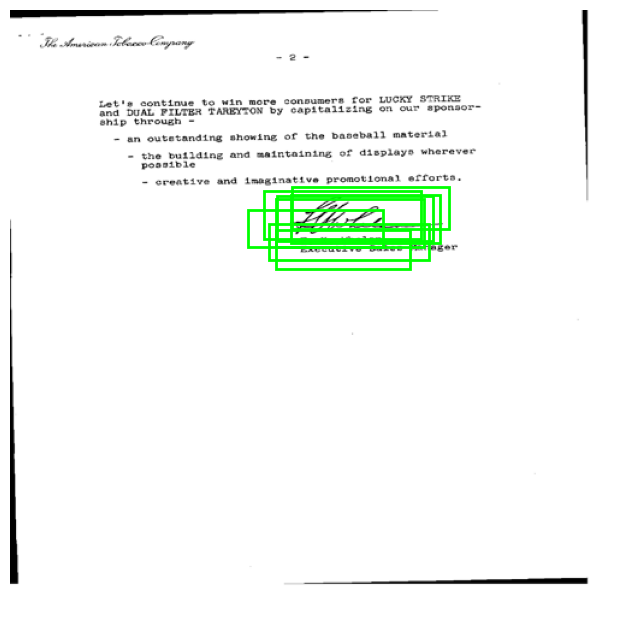

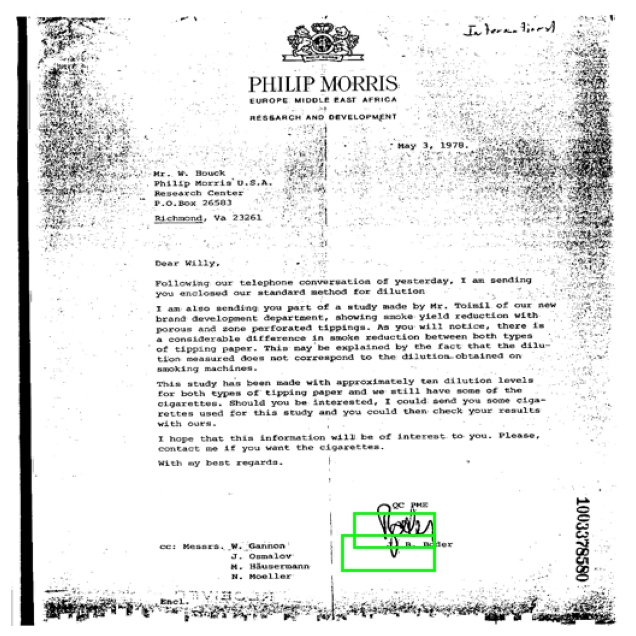

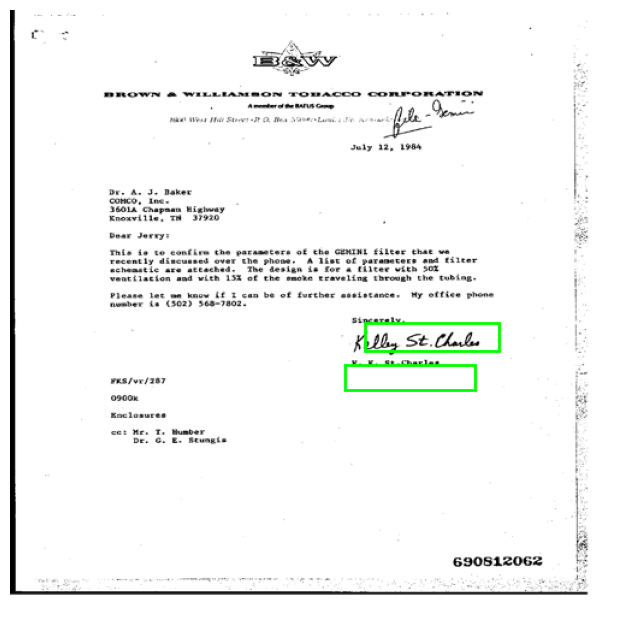

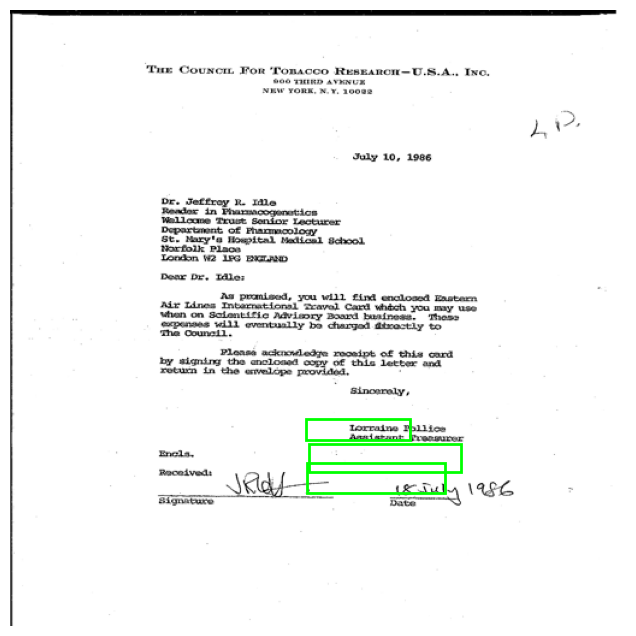

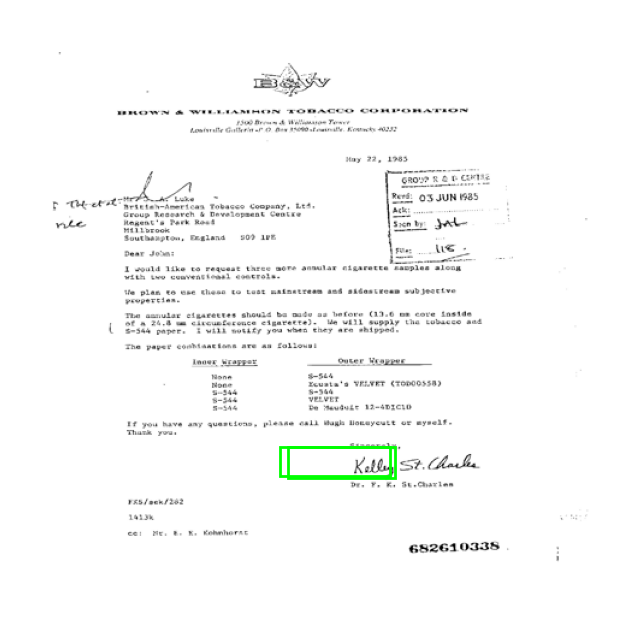

...

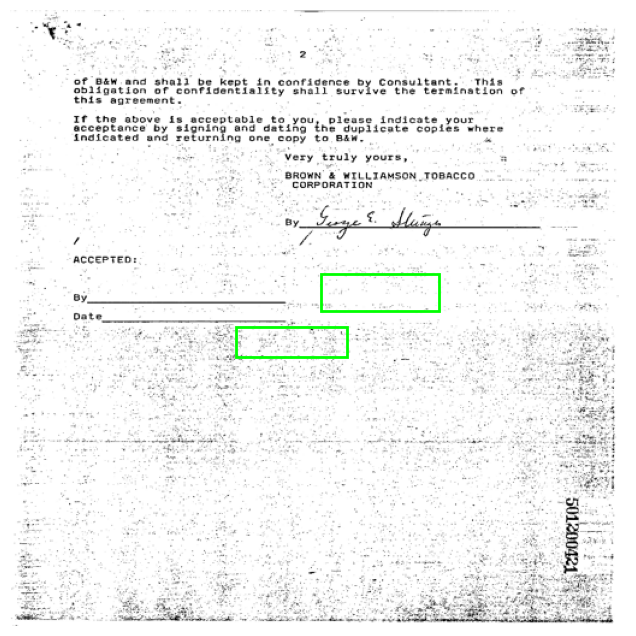

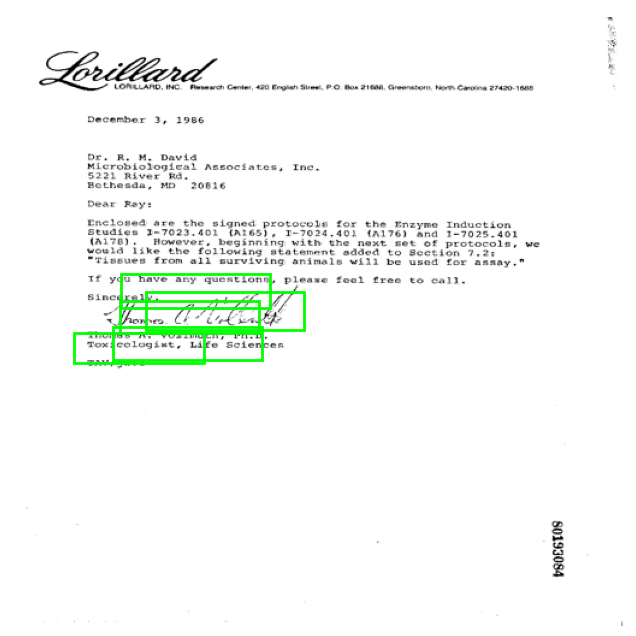

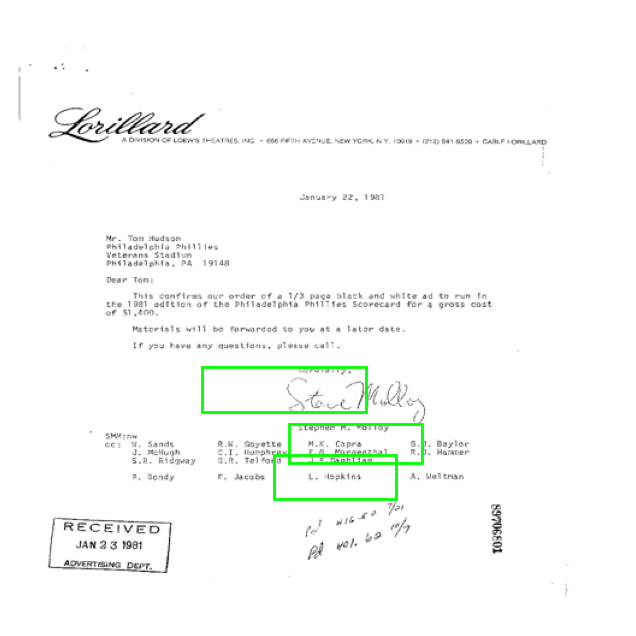

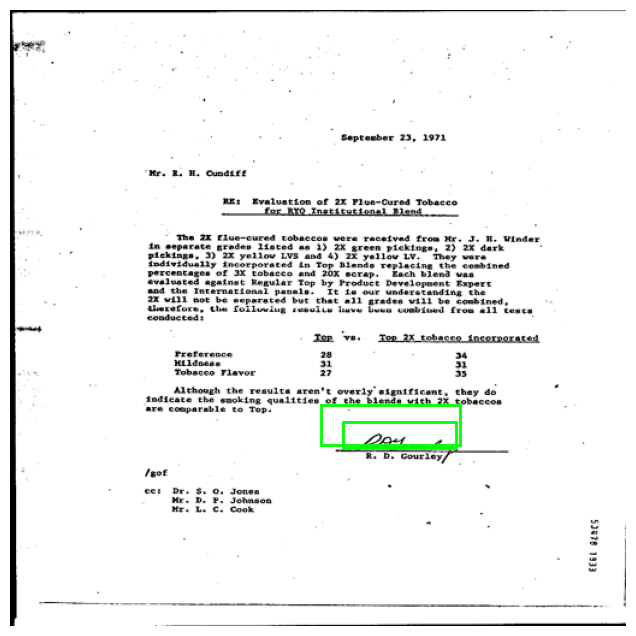

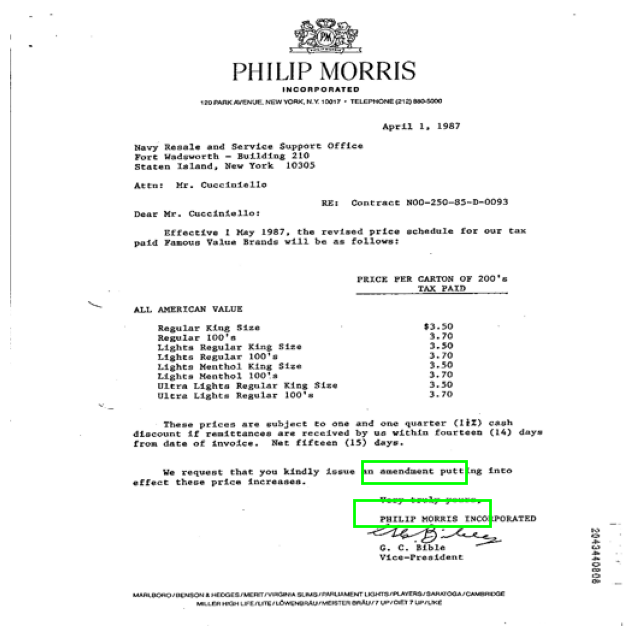

In [57]:
test_model(model, test_loader)

In [61]:
from torchvision.ops import nms

@torch.no_grad()
def test_model(model, dataloader, device='cuda', score_thresh=0.5, nms_thresh=0.3):
    model.eval()
    model.to(device)
    i=0
    for images, gt_boxes in dataloader:
        images = images.to(device)
        gt_boxes = gt_boxes[0].cpu()

        # Forward pass
        bbox_preds, all_proposals, all_scores = model(images)

        proposals = all_proposals[0]
        scores = all_scores[0]

        # Apply deltas to anchors
        refined_boxes = apply_deltas_to_anchors(proposals, bbox_preds)
        
        # Move boxes and scores to same device
        refined_boxes = refined_boxes.to(scores.device)

        # Filter by score threshold
        score_mask = scores > score_thresh
        refined_boxes = refined_boxes[score_mask]
        scores = scores[score_mask]

        if refined_boxes.size(0) == 0:
            print("No detections above threshold.")
            continue

        # Apply NMS
        keep = nms(refined_boxes, scores, iou_threshold=nms_thresh)
        final_boxes = refined_boxes[keep].cpu()
        final_scores = scores[keep].cpu()

        # Log metrics
        print(f"Predicted boxes: {len(final_boxes)}")
        print(f"Ground truth boxes: {len(gt_boxes)}")
        # Show image with predictions
        original_img = images[0].cpu()
        show_image_with_gt_and_preds(original_img,gt_boxes, final_boxes)
        # only visualize one sample
        if i>50:
            break
        else:
            i+=1

In [62]:
def show_image_with_gt_and_preds(image, gt_boxes, pred_boxes, scores=None):
    if isinstance(image, torch.Tensor):
        image = TF.to_pil_image(image)

    plt.figure(figsize=(8, 8))
    plt.imshow(image)

    for box in gt_boxes:
        x1, y1, x2, y2 = box.tolist()
        width, height = x2 - x1, y2 - y1
        rect = plt.Rectangle((x1, y1), width, height,
                             edgecolor='red', facecolor='none', linewidth=2, linestyle='--')
        plt.gca().add_patch(rect)
    for i, box in enumerate(pred_boxes):
        x1, y1, x2, y2 = box.tolist()
        width, height = x2 - x1, y2 - y1
        rect = plt.Rectangle((x1, y1), width, height,
                             edgecolor='blue', facecolor='none', linewidth=2)
        plt.gca().add_patch(rect)
    plt.axis('off')
    plt.show()


Predicted boxes: 2
Ground truth boxes: 1


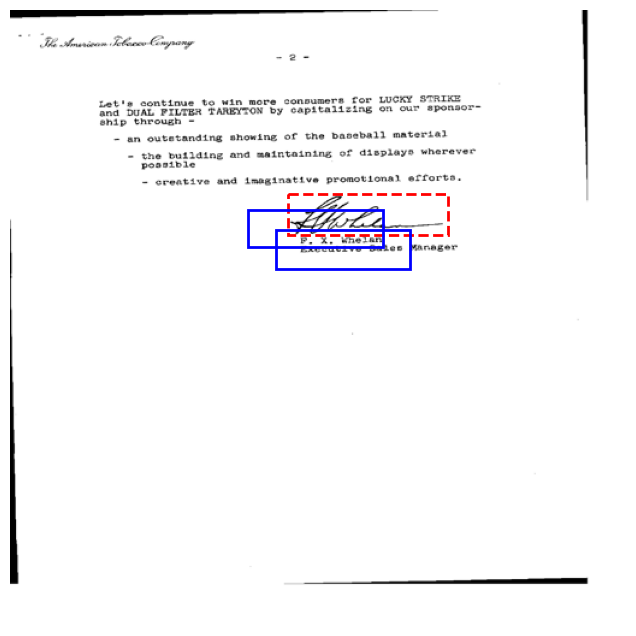

No detections above threshold.
No detections above threshold.
Predicted boxes: 2
Ground truth boxes: 1


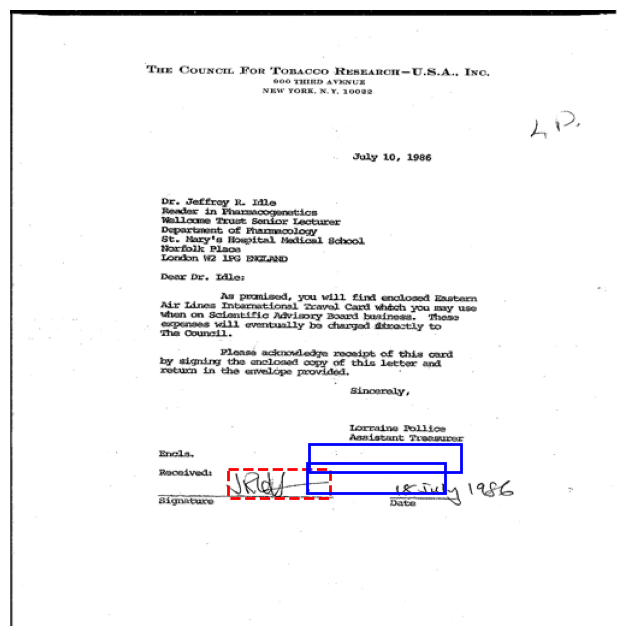

Predicted boxes: 1
Ground truth boxes: 1


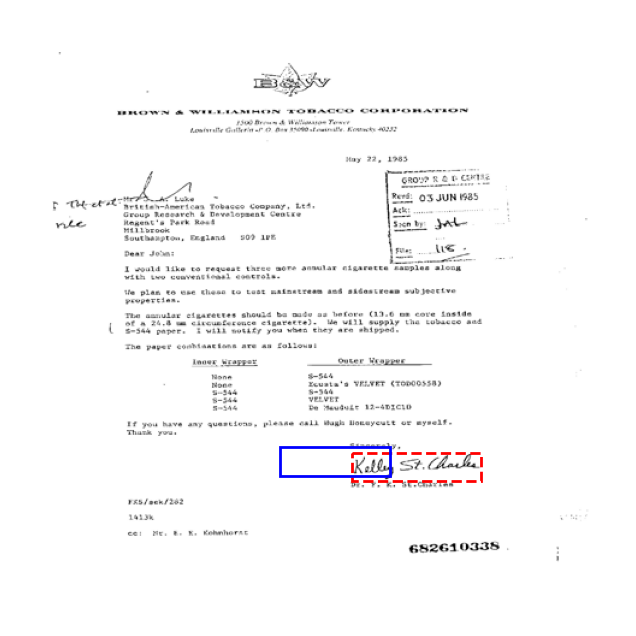

Predicted boxes: 2
Ground truth boxes: 1


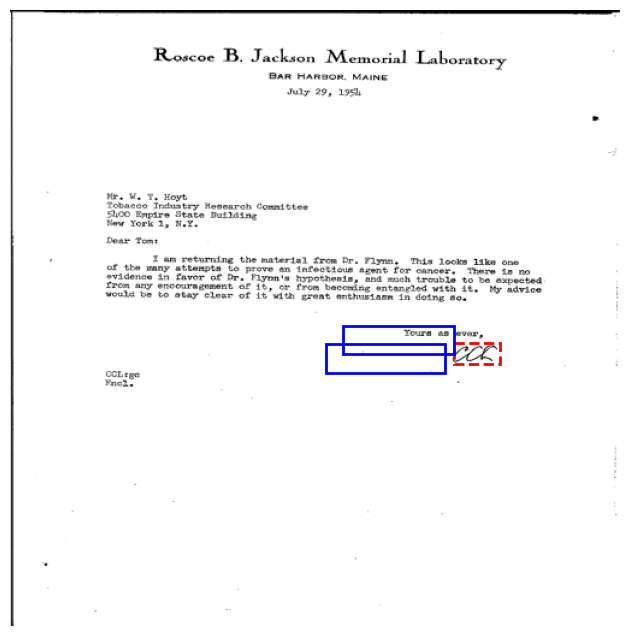

Predicted boxes: 1
Ground truth boxes: 1


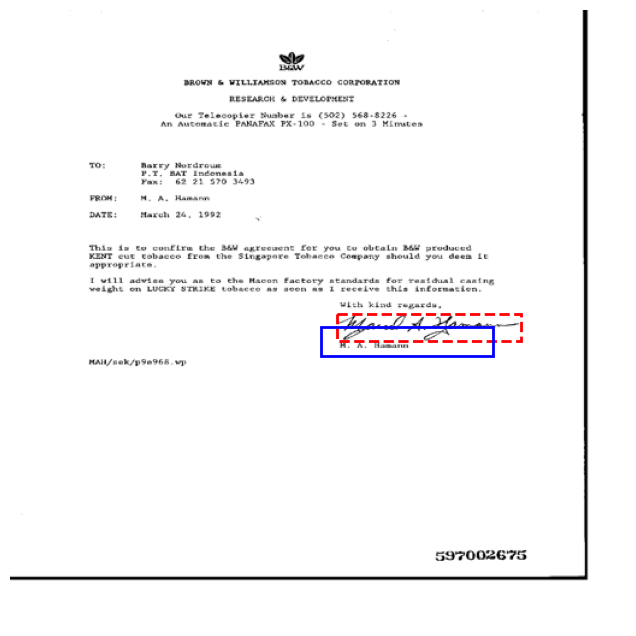

Predicted boxes: 2
Ground truth boxes: 1


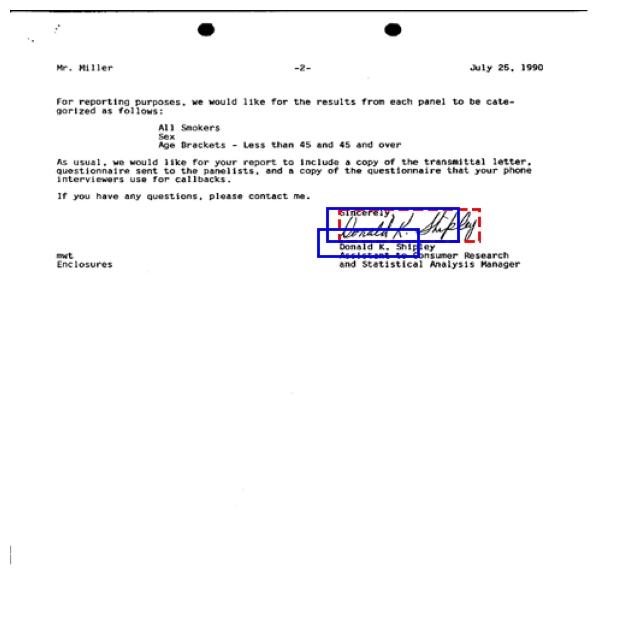

No detections above threshold.
Predicted boxes: 2
Ground truth boxes: 1


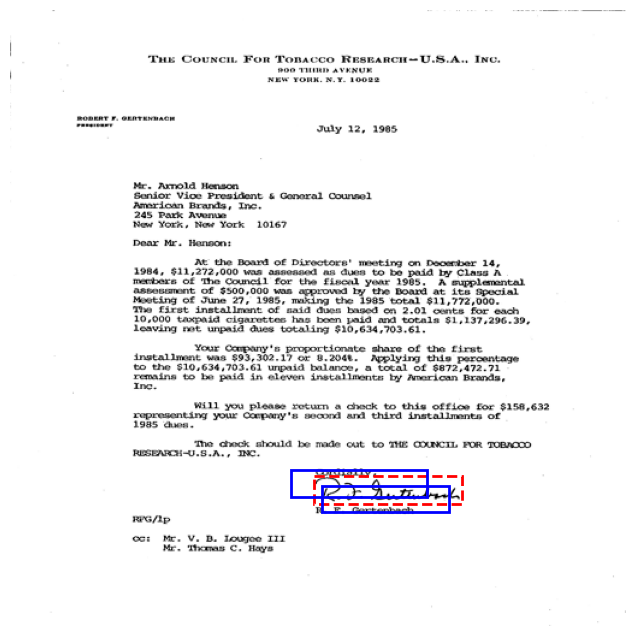

Predicted boxes: 1
Ground truth boxes: 1


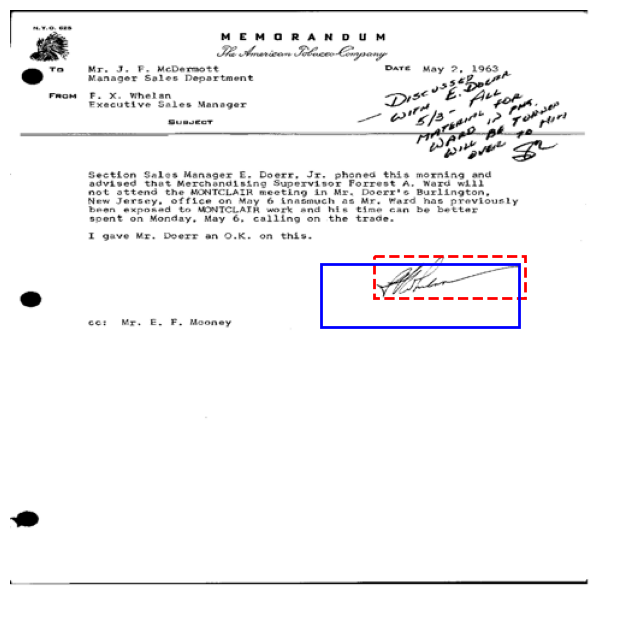

Predicted boxes: 2
Ground truth boxes: 1


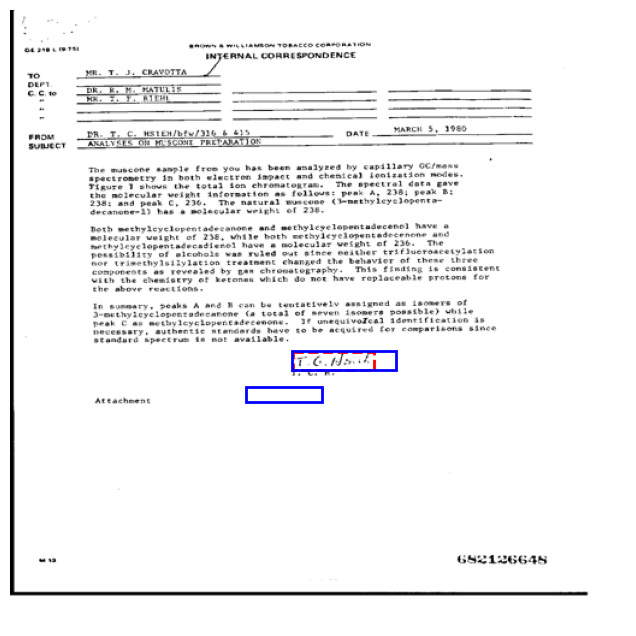

Predicted boxes: 3
Ground truth boxes: 1


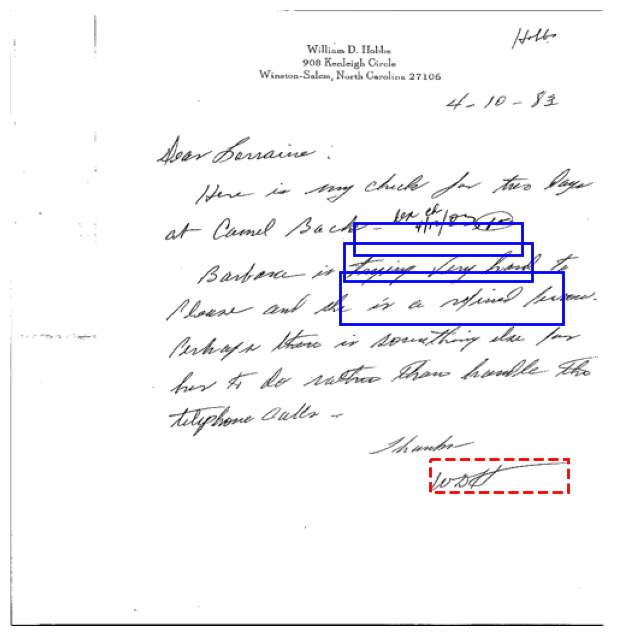

Predicted boxes: 1
Ground truth boxes: 1


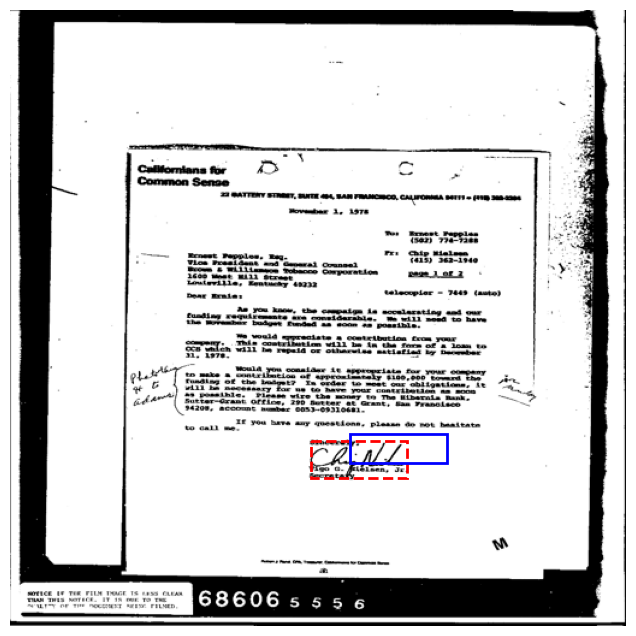

Predicted boxes: 1
Ground truth boxes: 2


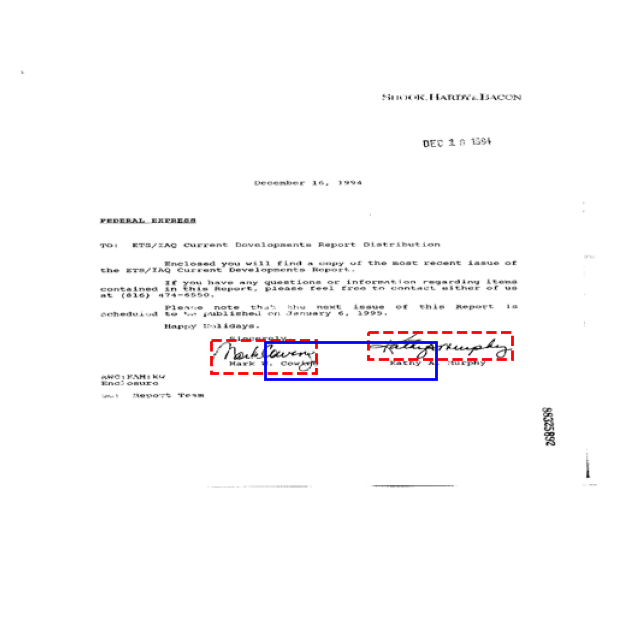

Predicted boxes: 1
Ground truth boxes: 1


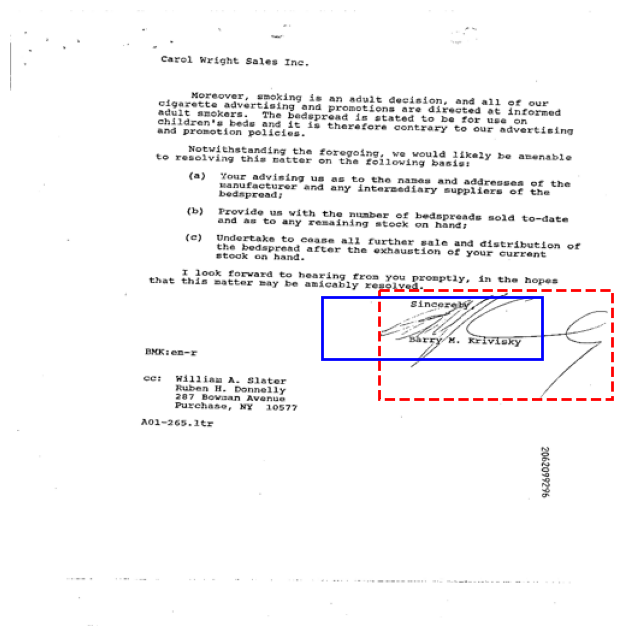

Predicted boxes: 1
Ground truth boxes: 1


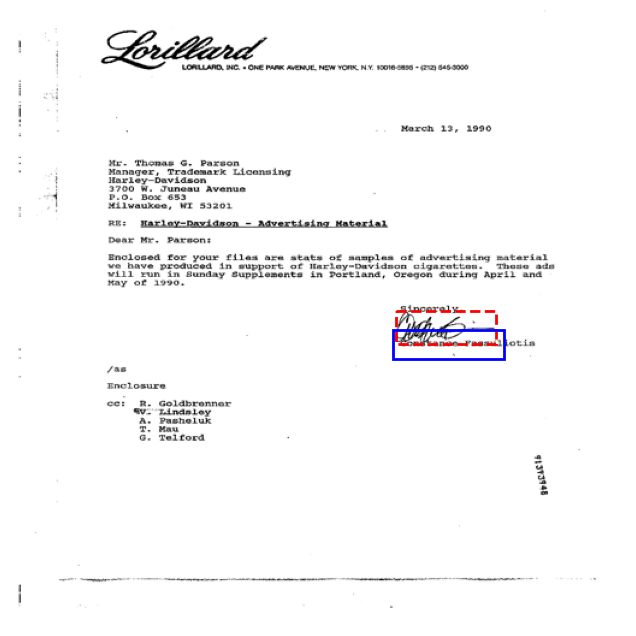

Predicted boxes: 1
Ground truth boxes: 1


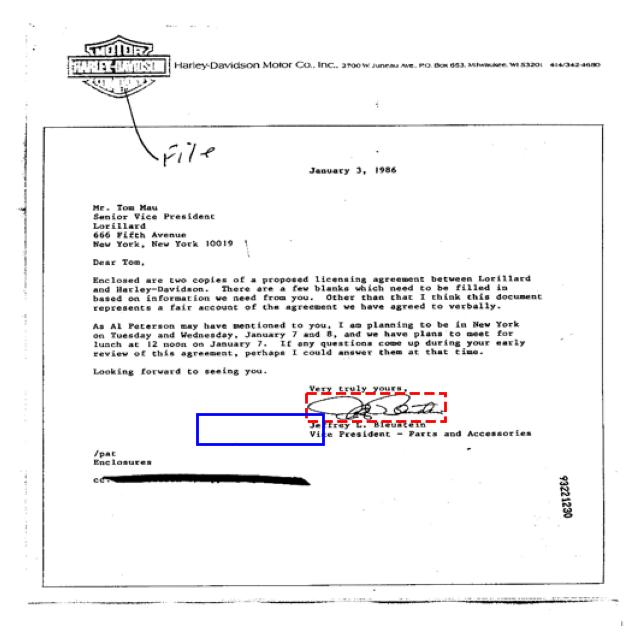

No detections above threshold.
Predicted boxes: 1
Ground truth boxes: 2


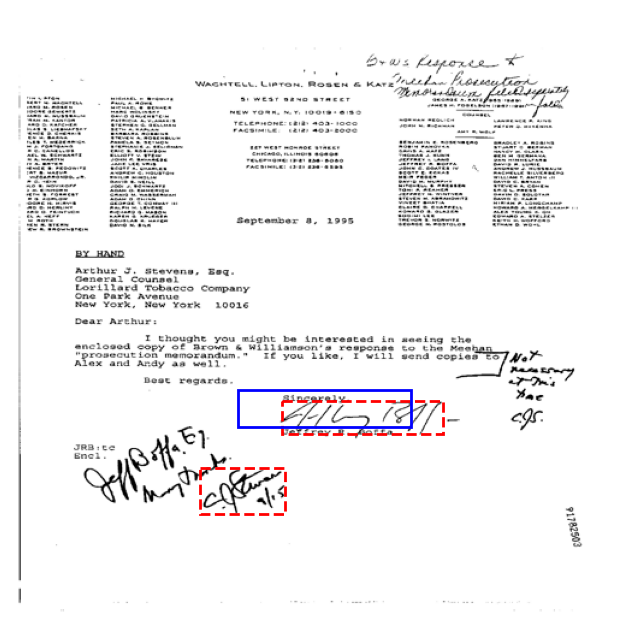

Predicted boxes: 1
Ground truth boxes: 1


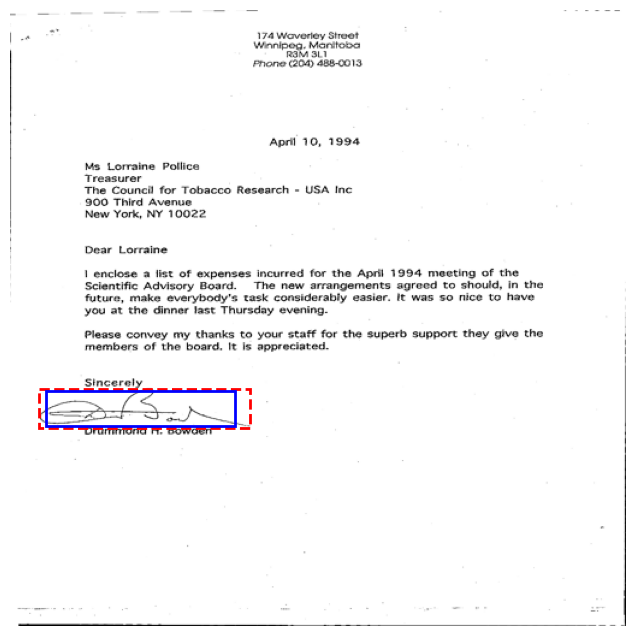

Predicted boxes: 4
Ground truth boxes: 1


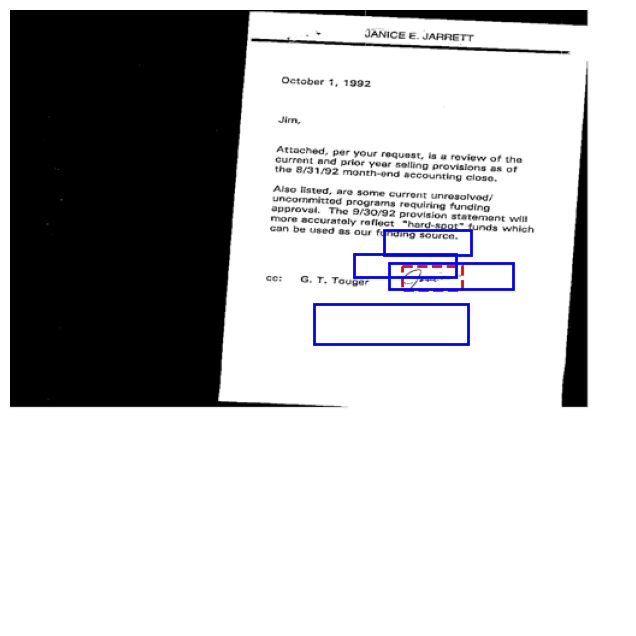

Predicted boxes: 2
Ground truth boxes: 1


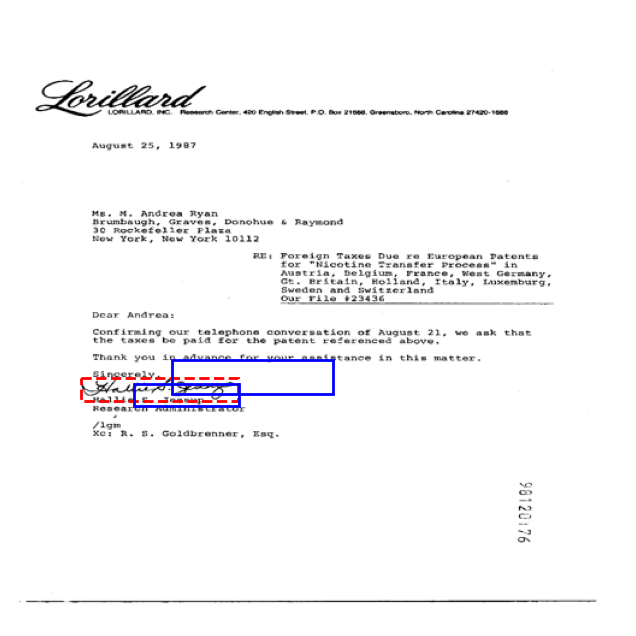

Predicted boxes: 1
Ground truth boxes: 1


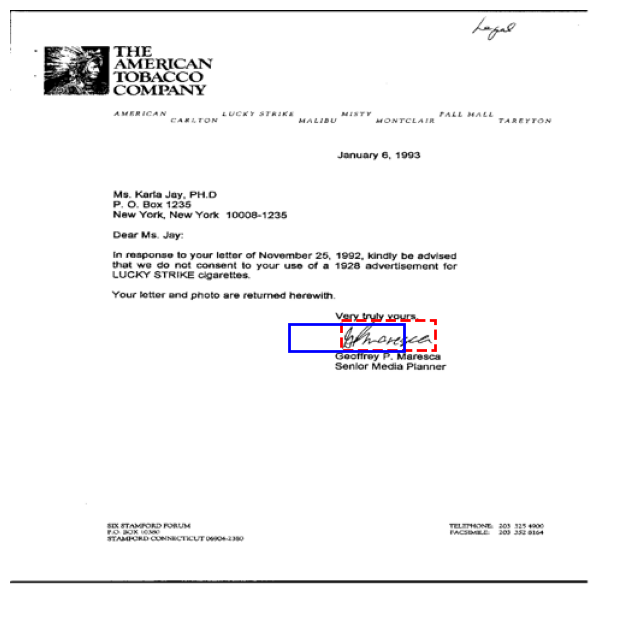

No detections above threshold.
No detections above threshold.
Predicted boxes: 1
Ground truth boxes: 3


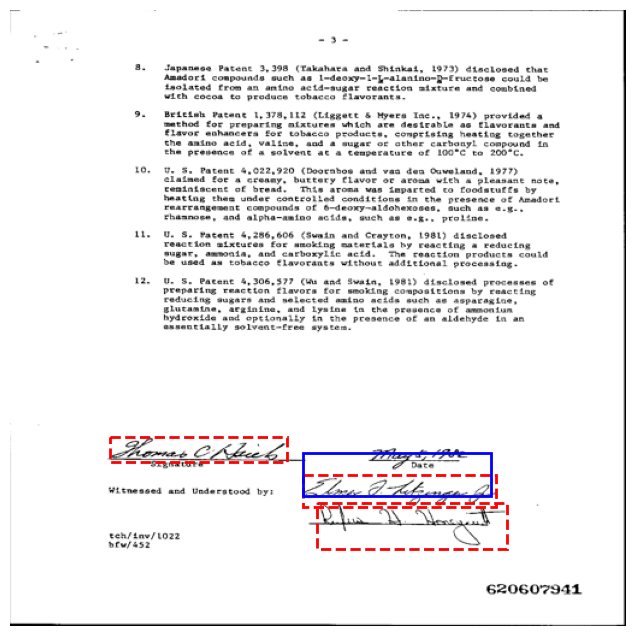

Predicted boxes: 1
Ground truth boxes: 1


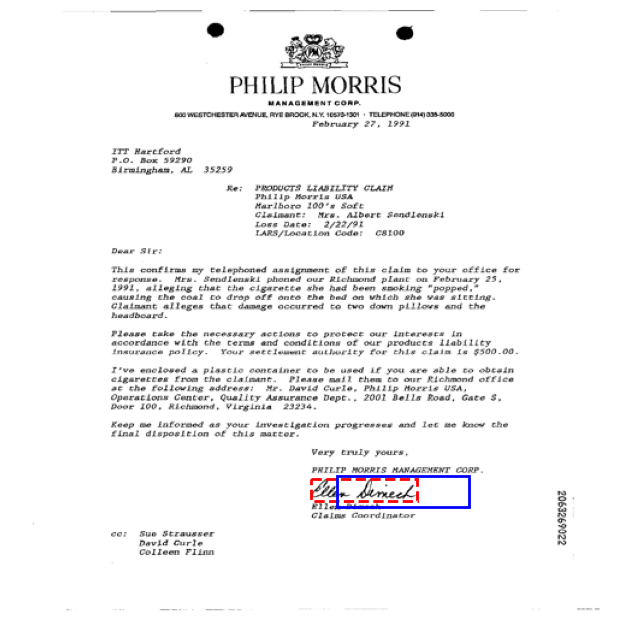

Predicted boxes: 2
Ground truth boxes: 1


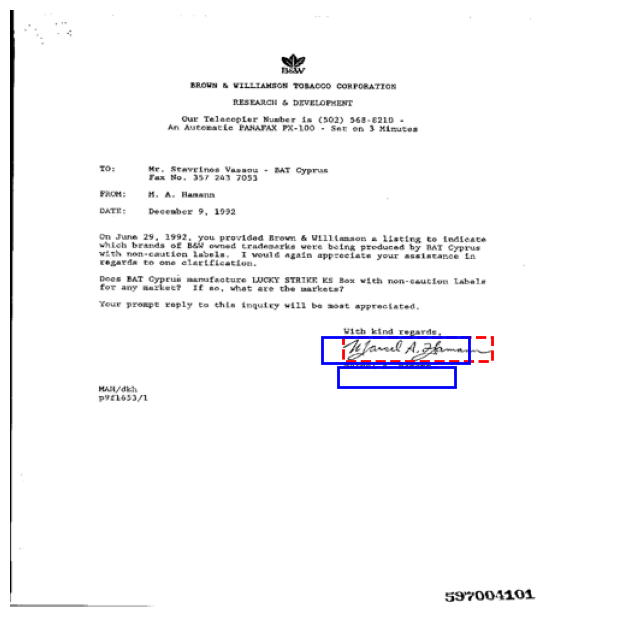

Predicted boxes: 1
Ground truth boxes: 1


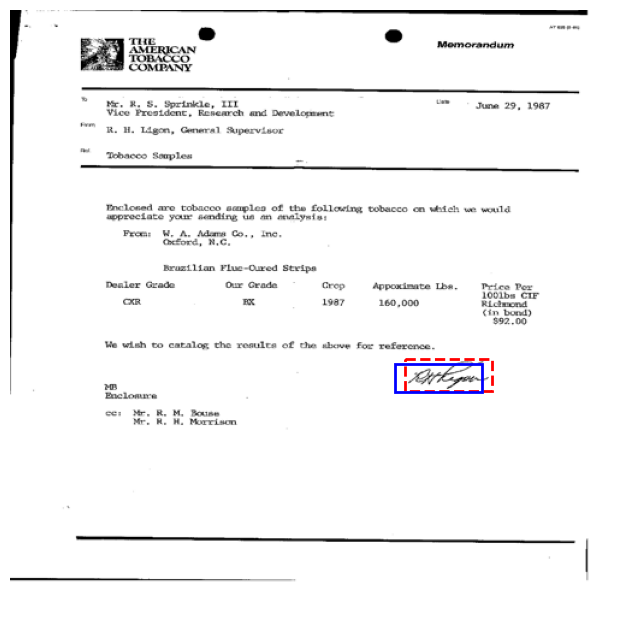

No detections above threshold.
Predicted boxes: 1
Ground truth boxes: 1


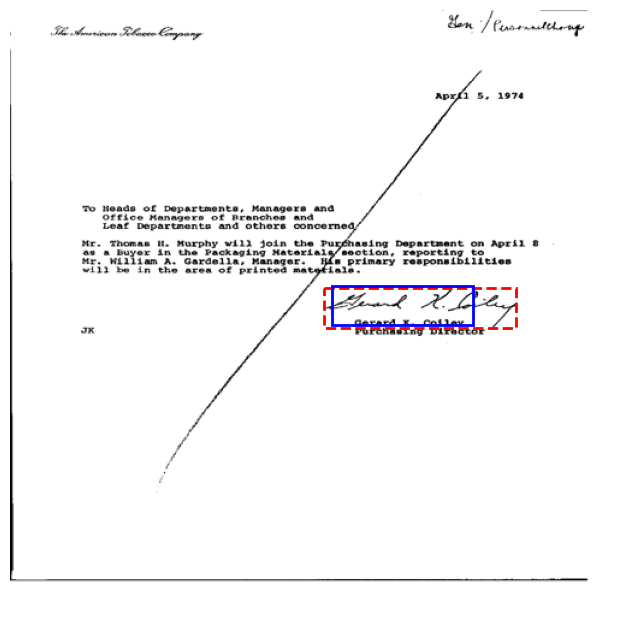

Predicted boxes: 2
Ground truth boxes: 2


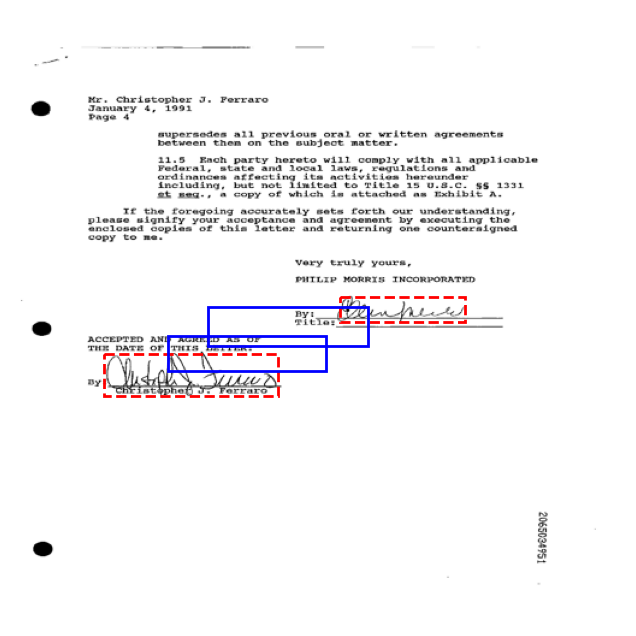

No detections above threshold.
Predicted boxes: 2
Ground truth boxes: 1


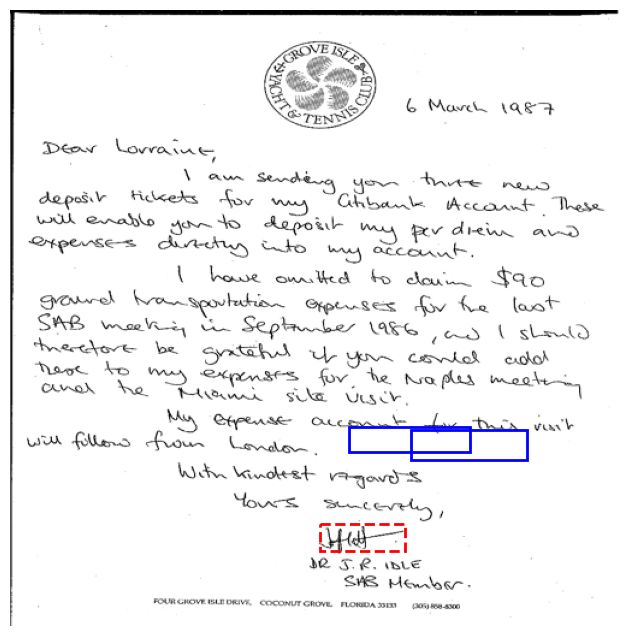

Predicted boxes: 1
Ground truth boxes: 1


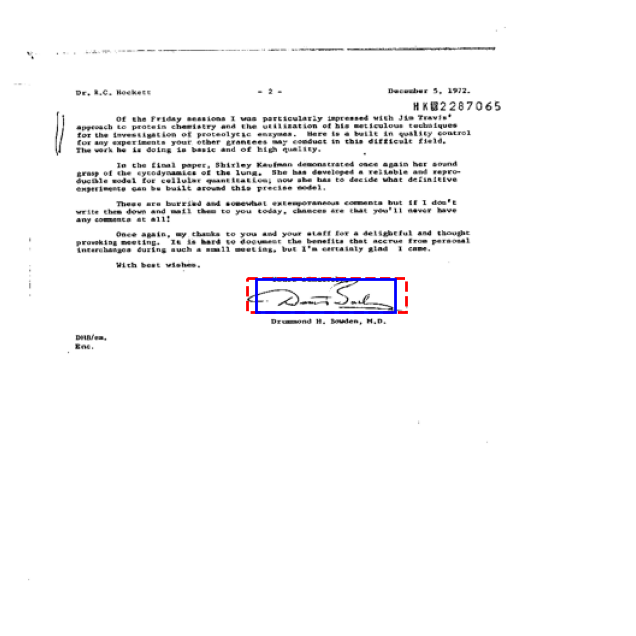

Predicted boxes: 2
Ground truth boxes: 1


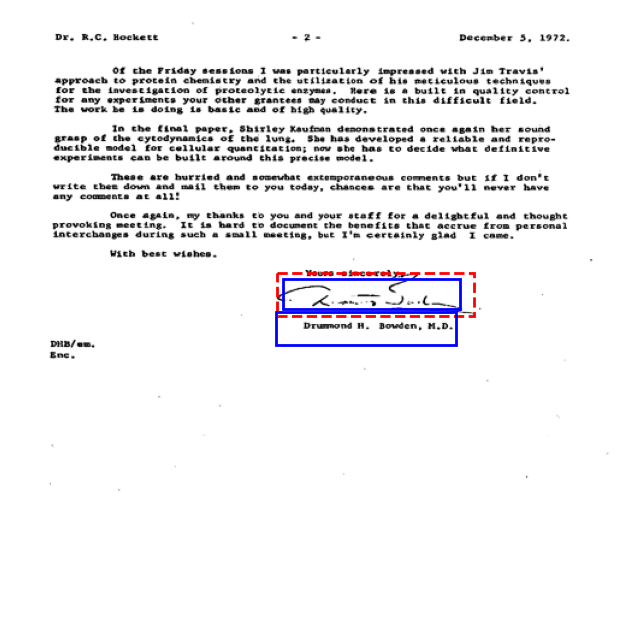

No detections above threshold.
Predicted boxes: 2
Ground truth boxes: 1


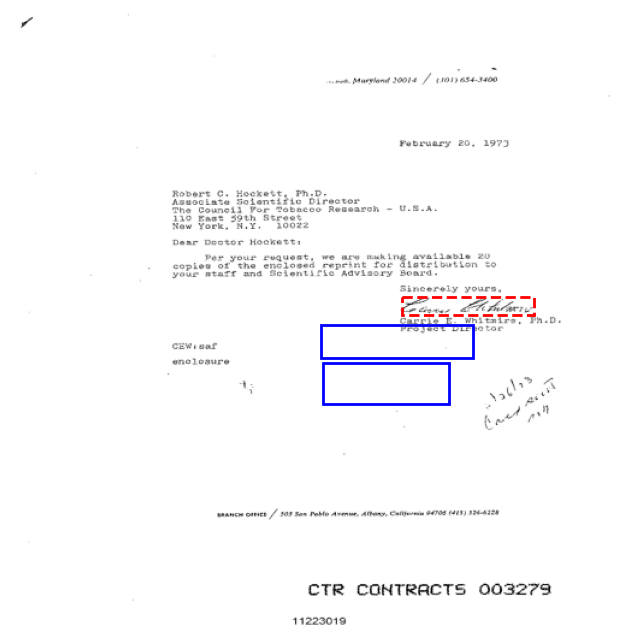

Predicted boxes: 1
Ground truth boxes: 1


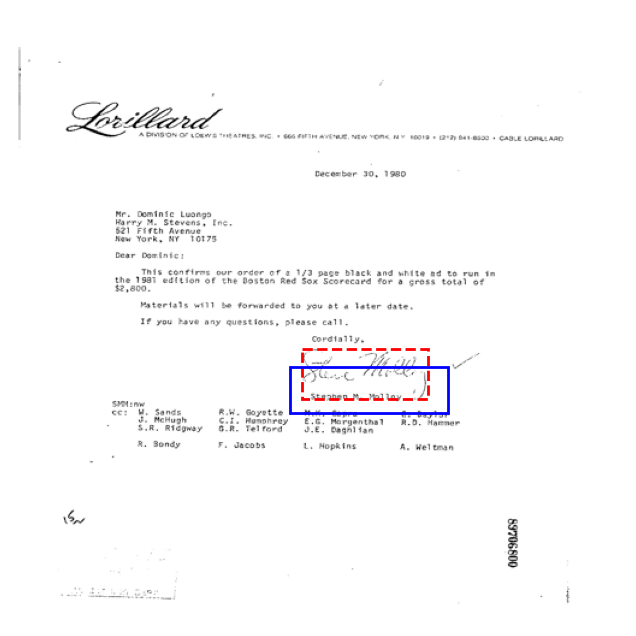

Predicted boxes: 1
Ground truth boxes: 1


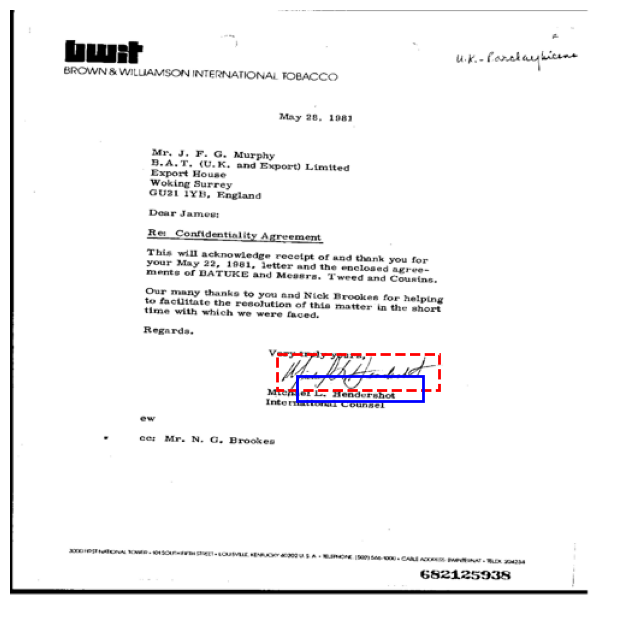

Predicted boxes: 2
Ground truth boxes: 1


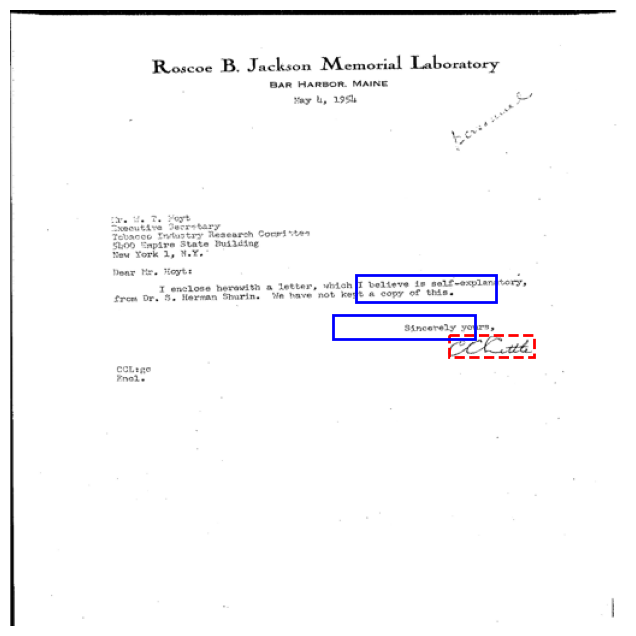

Predicted boxes: 1
Ground truth boxes: 1


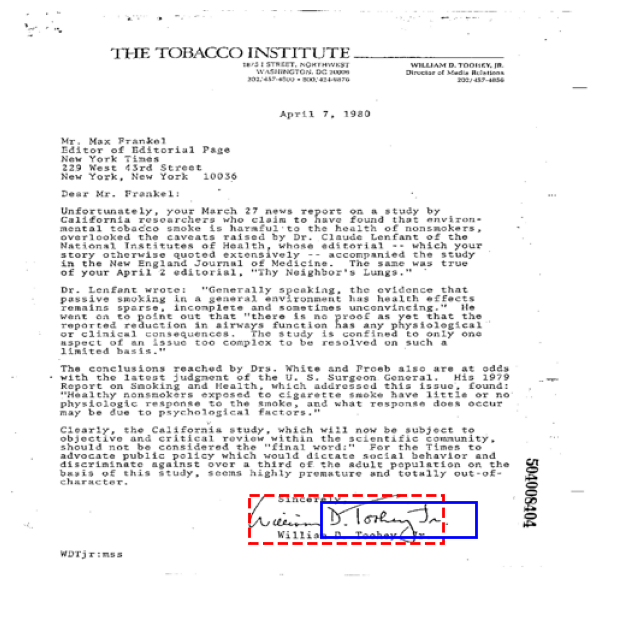

Predicted boxes: 2
Ground truth boxes: 1


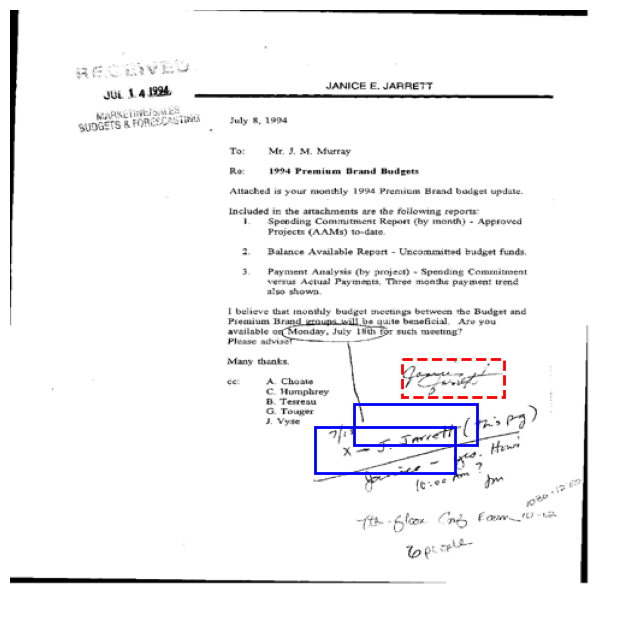

Predicted boxes: 2
Ground truth boxes: 1


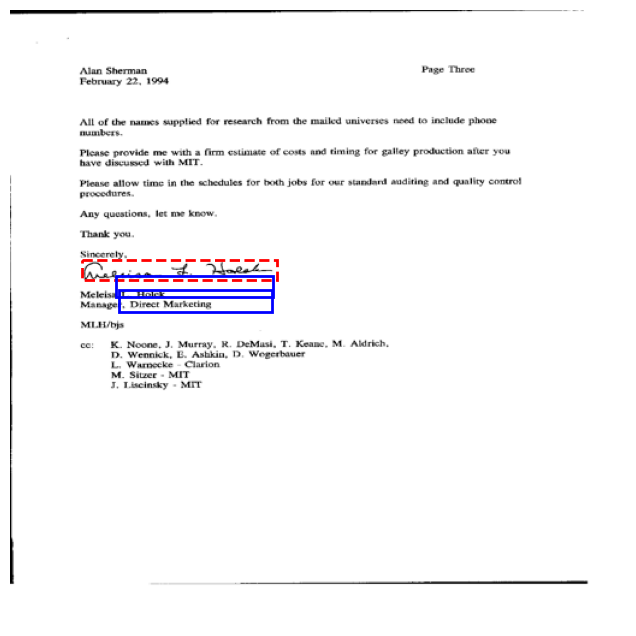

No detections above threshold.
Predicted boxes: 1
Ground truth boxes: 1


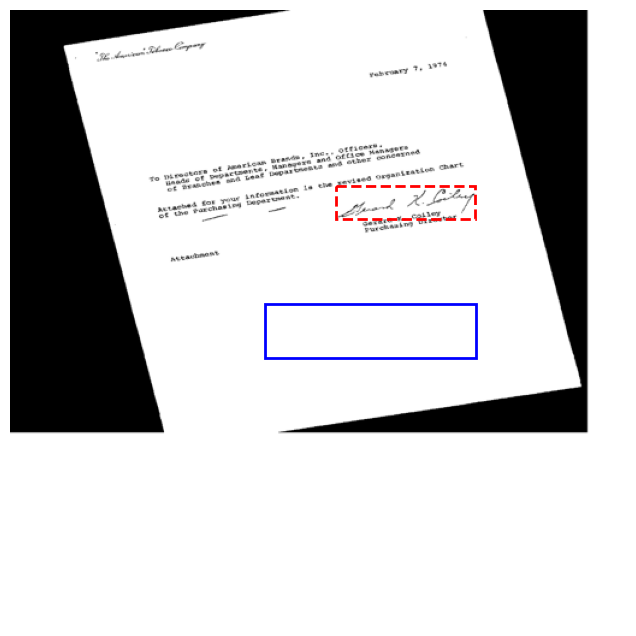

Predicted boxes: 2
Ground truth boxes: 1


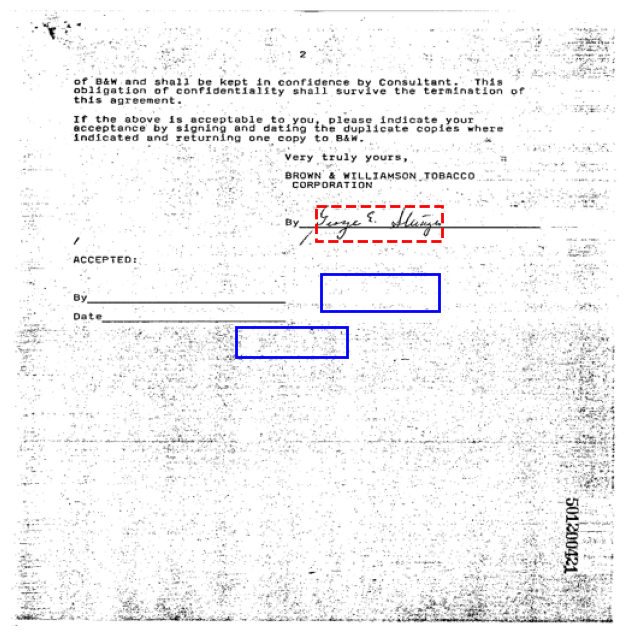

Predicted boxes: 2
Ground truth boxes: 1


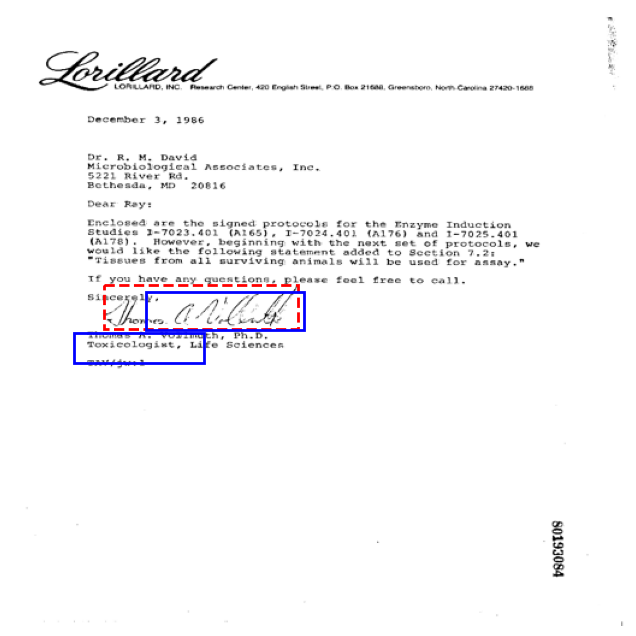

Predicted boxes: 2
Ground truth boxes: 1


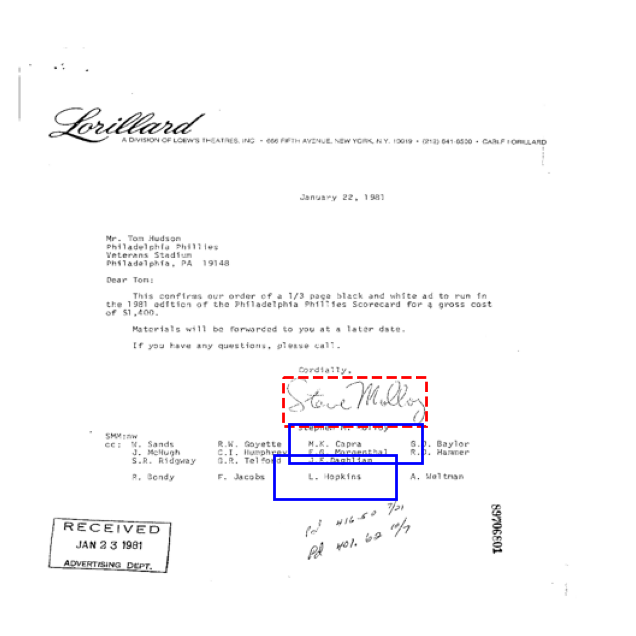

Predicted boxes: 1
Ground truth boxes: 1


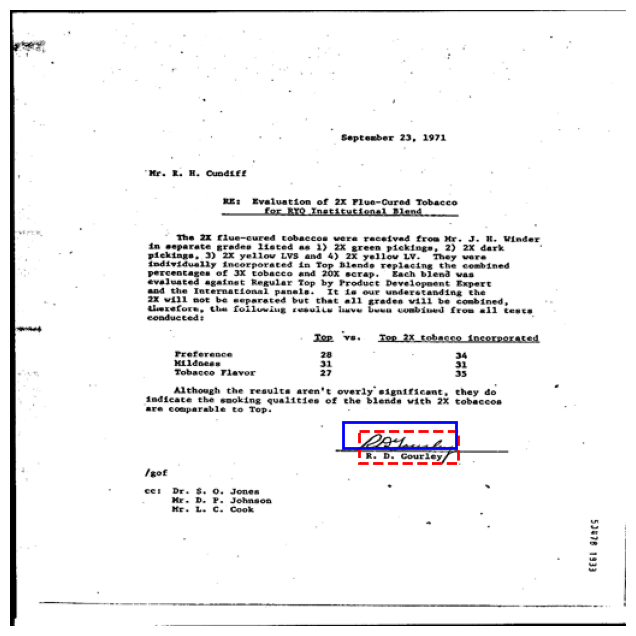

Predicted boxes: 1
Ground truth boxes: 1


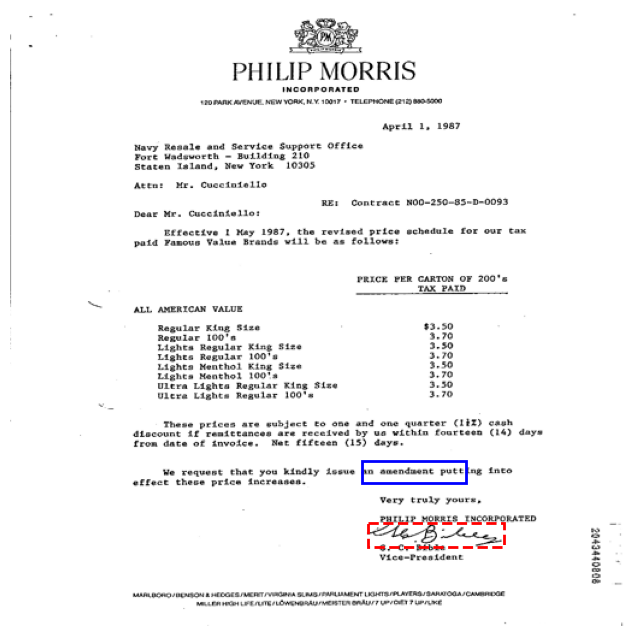

Predicted boxes: 3
Ground truth boxes: 1


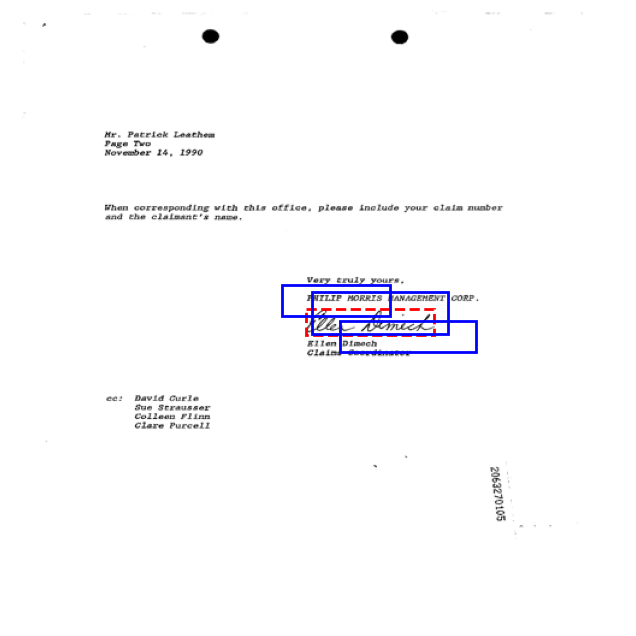

Predicted boxes: 2
Ground truth boxes: 1


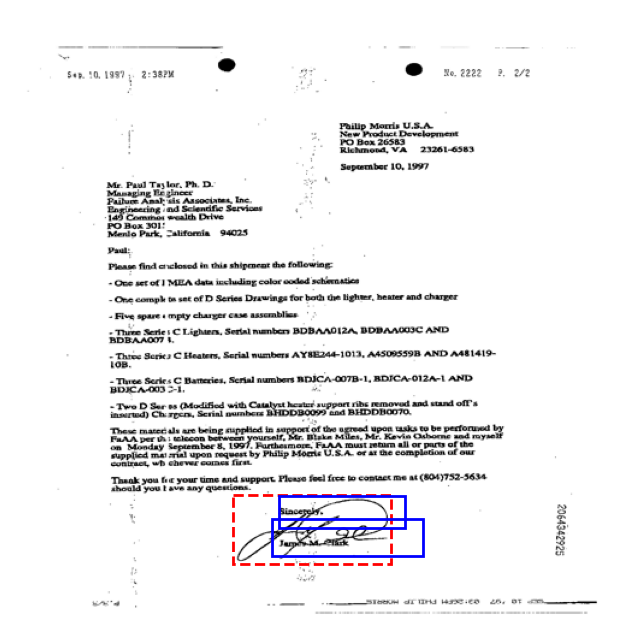

Predicted boxes: 1
Ground truth boxes: 1


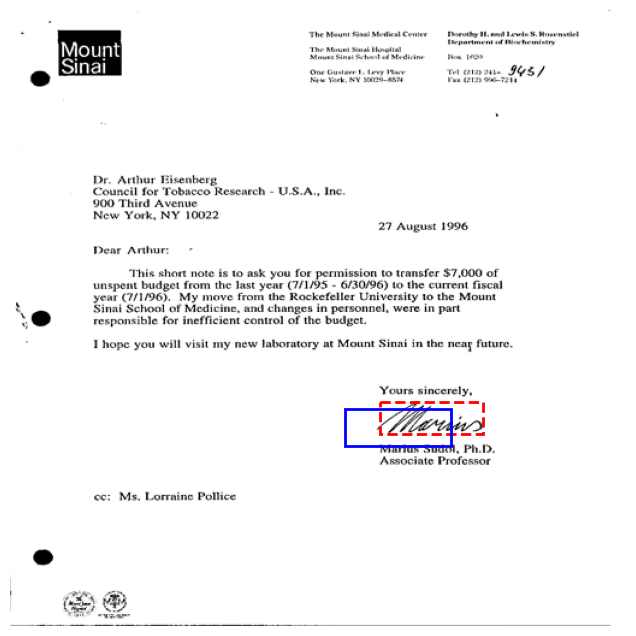

Predicted boxes: 1
Ground truth boxes: 1


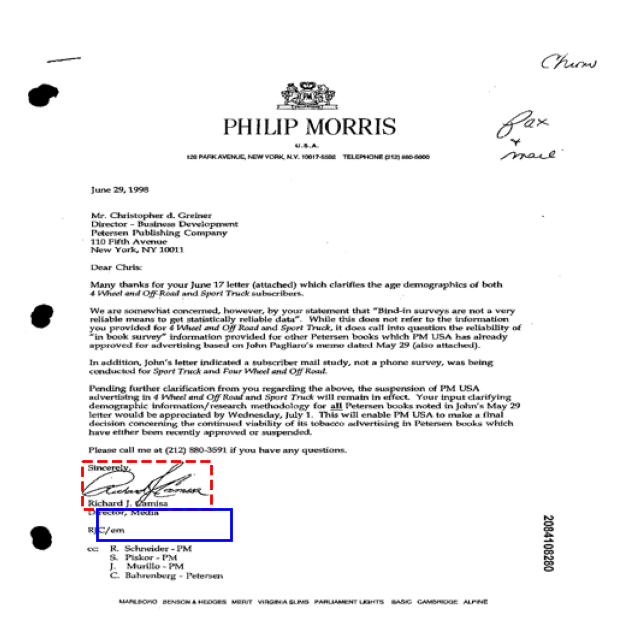

Predicted boxes: 1
Ground truth boxes: 1


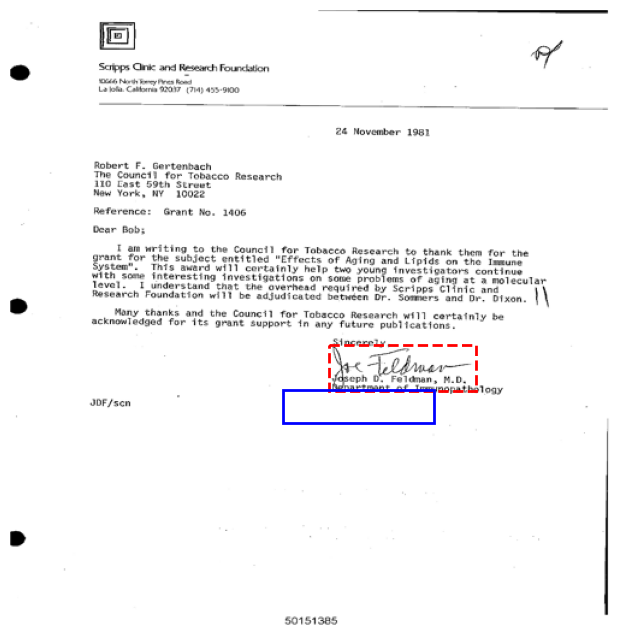

Predicted boxes: 1
Ground truth boxes: 1


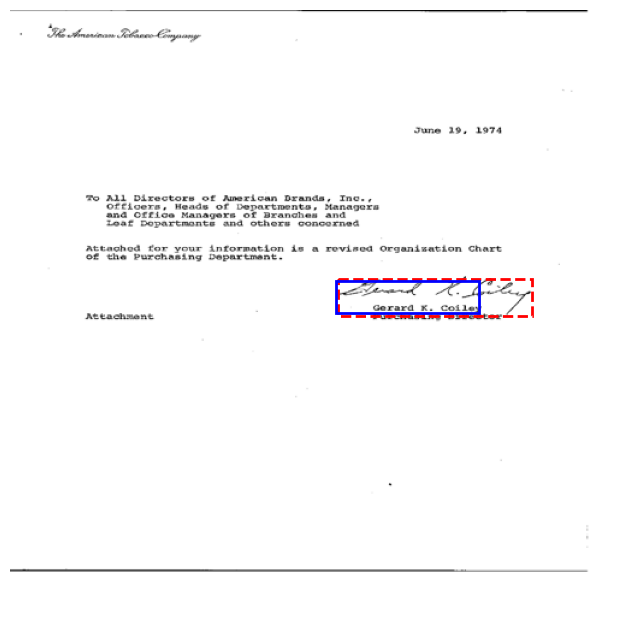

Predicted boxes: 2
Ground truth boxes: 1


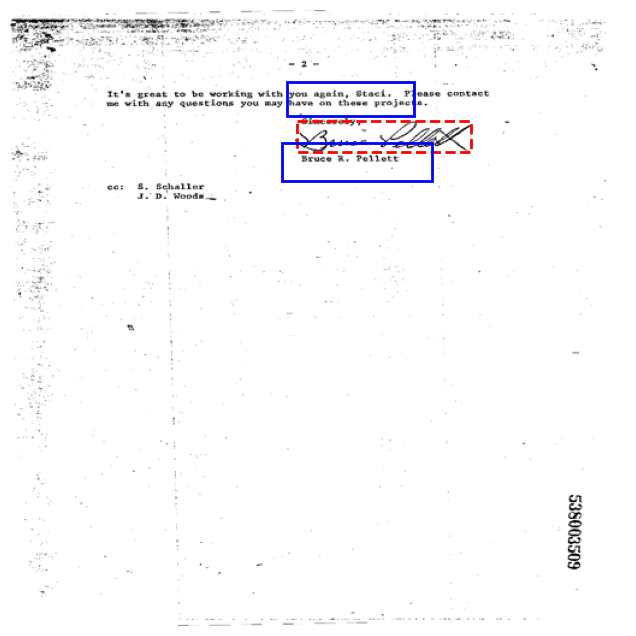

No detections above threshold.
No detections above threshold.
Predicted boxes: 1
Ground truth boxes: 1


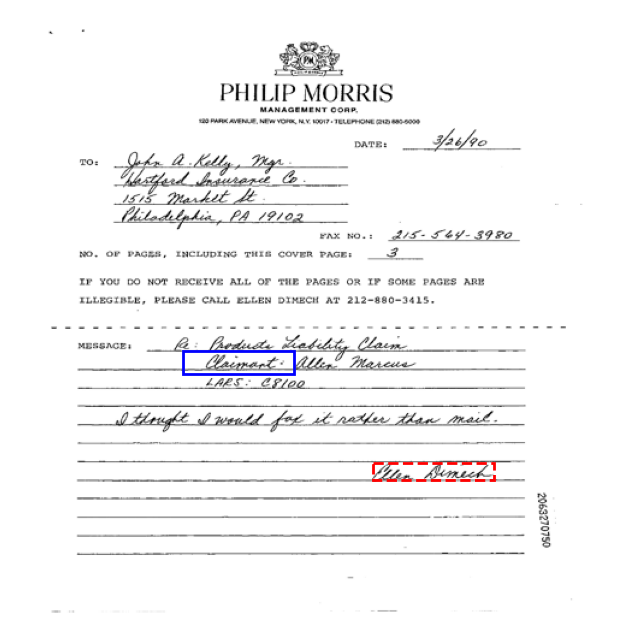

Predicted boxes: 2
Ground truth boxes: 1


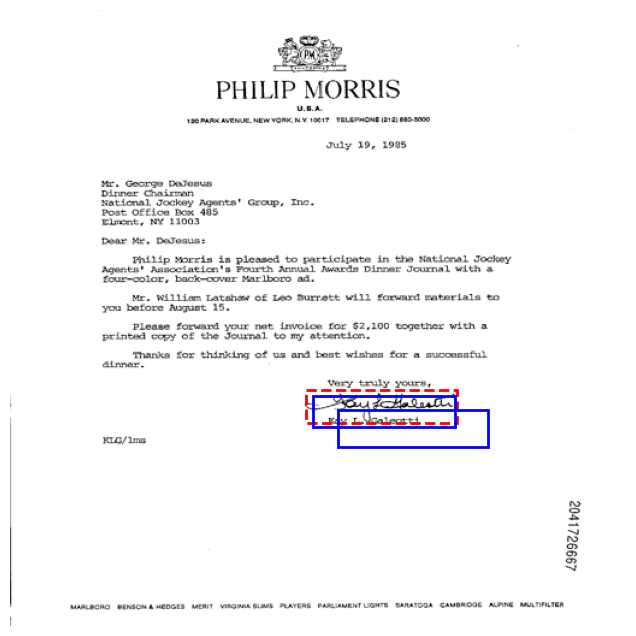

Predicted boxes: 1
Ground truth boxes: 2


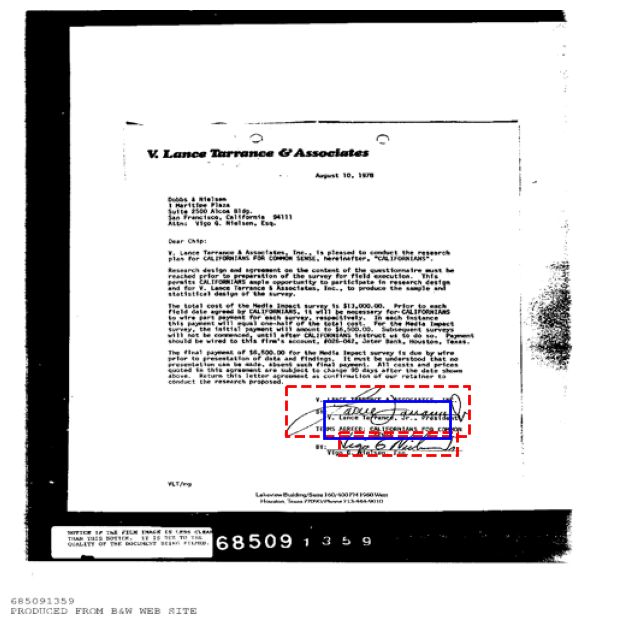

In [63]:
test_model(model, test_loader, score_thresh=0.0001, nms_thresh=0.3)